In [87]:
from configparser import ConfigParser
import psycopg2
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [88]:
def config(filename='./database.ini', section='postgresql'):
    # create a parser
    parser = ConfigParser()
    # read config file
    parser.read(filename)
  
    # get section, default to postgresql
    db = {}
    if parser.has_section(section):
        params = parser.items(section)
        for param in params:
            db[param[0]] = param[1]
    else:
        raise Exception('Section {0} not found in the {1} file'.format(section, filename))
  
    return db


In [89]:
def connect():
    """ Connect to the PostgreSQL database server """
    conn = None
    result = []
    try:
        # read connection parameters
        params = config()
  
        # connect to the PostgreSQL server
        print('Connecting to the PostgreSQL database...')
        conn = psycopg2.connect(**params)
          
        # create a cursor
        cur = conn.cursor()
          
    # execute a statement
        print('PostgreSQL database version:')
        cur.execute('SELECT version()')
  
        # display the PostgreSQL database server version
        db_version = cur.fetchone()
        print(db_version)
        cur.execute("""select distinct to_char("FromDateTime", 'YYYY:MM:DD-HH24'), "StationName",
            valuespairsname, avg("Value")
            from airly."JoinAll"
            where "FromDateTime" >= '2023-03-20'
            and "AveragedValueTimeType" = 2
            group by to_char("FromDateTime", 'YYYY:MM:DD-HH24'), "StationName", valuespairsname
            order by to_char("FromDateTime", 'YYYY:MM:DD-HH24');""")
        
        measurements = cur.fetchall()
        cur.execute("""
                    select distinct "StationName", valuespairsname
                    from airly."JoinAll"
                    order by "StationName", valuespairsname;""")
        stations = cur.fetchall()
    # close the communication with the PostgreSQL
        cur.close()
    except (Exception, psycopg2.DatabaseError) as error:
        print(error)
    finally:
        if conn is not None:
            conn.close()
            print('Database connection closed.')
    return measurements, stations

In [90]:
measurements_data, stations_data = connect()

print(len(measurements_data))
print(len(stations_data))

Connecting to the PostgreSQL database...
PostgreSQL database version:
('PostgreSQL 15.2 on aarch64-unknown-linux-musl, compiled by gcc (Alpine 12.2.1_git20220924-r4) 12.2.1 20220924, 64-bit',)
Database connection closed.
209831
118


In [91]:
print(measurements_data[100])
print(stations_data[0])

('2023:03:20-17', ' Rynek mogilany', 'TEMPERATURE', 10.24)
(' Miętowa, prusy', 'HUMIDITY')


In [92]:
import time
from datetime import datetime
from time import mktime

df_m = pd.DataFrame(measurements_data, columns=["Time", "Station", "Pollution", "Value"])
df_m["Time"] = df_m["Time"].apply(lambda x: pd.to_datetime(x, format="%Y:%m:%d-%H"))
df_m.tail(20)

,Time,Station,Pollution,Value
209811,2023-06-11 20:00:00,Niepołomice szkolna,WIND_BEARING,77.81
209812,2023-06-11 20:00:00,Niepołomice szkolna,WIND_SPEED,12.23
209813,2023-06-11 20:00:00,"liski, szkolna",HUMIDITY,68.04
209814,2023-06-11 20:00:00,"liski, szkolna",PM1,6.11
209815,2023-06-11 20:00:00,"liski, szkolna",PM10,10.84
209816,2023-06-11 20:00:00,"liski, szkolna",PM25,8.58
209817,2023-06-11 20:00:00,"liski, szkolna",PRESSURE,1013.34
209818,2023-06-11 20:00:00,"liski, szkolna",TEMPERATURE,16.78
209819,2023-06-11 20:00:00,"liski, szkolna",WIND_BEARING,76.00
209820,2023-06-11 20:00:00,"liski, szkolna",WIND_SPEED,14.28


In [93]:
places = df_m["Station"].value_counts()
print(places)

Świętego Wawrzyńca                  19883
Franciszka Bujaka                   18533
 liski, szkolna                     15901
 Niepołomice szkolna                15890
Krakowska - Zabierzów               15890
 Wieliczka - Karola Kuczkiewicza    15885
 Skała, rynek                       15882
Węgrzce                             15877
 Rynek mogilany                     15874
 Miętowa, prusy                     15722
Emaus                               13365
Bulwarowa                           10745
Aleja Zygmunta Krasińskiego          8695
Skawina                              6828
Kaszów, no2                          4861
Name: Station, dtype: int64


In [94]:
stations = df_m["Pollution"].value_counts()
print(stations)

PM10            27302
PM25            25345
WIND_BEARING    23068
WIND_SPEED      23068
PM1             21468
PRESSURE        21452
HUMIDITY        17781
TEMPERATURE     17781
NO2             15319
O3               9458
CO               3893
SO2              3892
NO                  4
Name: Pollution, dtype: int64


In [95]:
min_time = df_m["Time"].min()
print(min_time)

max_time = df_m["Time"].max()
print(max_time)

2023-03-20 16:00:00
2023-06-11 20:00:00


In [96]:
np.count_nonzero(df_m.isna().values)

0

In [97]:
df_s = pd.DataFrame(stations_data, columns=["Station", "Pollution"])
df_s.head()

,Station,Pollution
0,"Miętowa, prusy",HUMIDITY
1,"Miętowa, prusy",PM1
2,"Miętowa, prusy",PM10
3,"Miętowa, prusy",PM25
4,"Miętowa, prusy",PRESSURE


In [98]:
def create_dataset(df_m, df_s):
    df_m["Timestamp"] = df_m["Time"].apply(lambda x: int(x.timestamp()//3600))
    min_time = df_m["Timestamp"].min()
    max_time = df_m["Timestamp"].max()
#     print(min_time, max_time)
#     print((max_time - min_time))
    hours = int((max_time - min_time))
    data = np.full((hours, 84), np.nan)
    time = min_time
    i = 0
    while time < max_time:
        hours_data = df_m.loc[df_m["Timestamp"] == time]
        for index in range(84):
            #print(df_s)
            #print(df_s["Station"].iloc[index])
            #print(df_s["Pollution"].iloc[index])
            #print(hours_data.loc[(hours_data["Station"] == df_s["Station"].iloc[index]) & (hours_data["Pollution"] == df_s["Pollution"].iloc[index])])
            element = hours_data.loc[
                                    (hours_data["Station"] == df_s["Station"].iloc[index]) & 
                                    (hours_data["Pollution"] == df_s["Pollution"].iloc[index])]
            #print(element)
            if len(element) != 1:
                print(element, i%24, df_s["Station"].iloc[index], df_s["Pollution"].iloc[index])
            if len(element) > 0:
                data[i, index] = element["Value"].values[0]
            
        #print(time)
        time += 1
        i += 1
    
    return data 

In [99]:
data = create_dataset(df_m, df_s)
print(data.shape)

Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Miętowa, prusy WIND_BEARING
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Miętowa, prusy WIND_SPEED
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Niepołomice szkolna WIND_BEARING
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Niepołomice szkolna WIND_SPEED
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Rynek mogilany WIND_BEARING
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Rynek mogilany WIND_SPEED
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Skała, rynek WIND_BEARING
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Skała, rynek WIND_SPEED
Empty DataFrame
Columns: [Time, Station, Pollution, Value, Timestamp]
Index: [] 0  Wieliczka - Karola Kuczkiewicza

In [100]:
np.count_nonzero(np.isnan(data))

17303

In [101]:
df_m['WeekDay'] = df_m["Time"].apply(lambda x: x.weekday())
df_m["Hours"] = df_m['Time'].apply(lambda x: x.hour)

df_m.head()

,Time,Station,Pollution,Value,Timestamp,WeekDay,Hours
0,2023-03-20 16:00:00,"Miętowa, prusy",HUMIDITY,71.01,466480,0,16
1,2023-03-20 16:00:00,"Miętowa, prusy",PM1,20.49,466480,0,16
2,2023-03-20 16:00:00,"Miętowa, prusy",PM10,45.50,466480,0,16
3,2023-03-20 16:00:00,"Miętowa, prusy",PM25,31.98,466480,0,16
4,2023-03-20 16:00:00,"Miętowa, prusy",PRESSURE,1014.43,466480,0,16


In [102]:
df_m.describe()

,Value,Timestamp,WeekDay,Hours
count,209831.000000,209831.000000,209831.000000,209831.000000
mean,148.748837,467467.607432,3.023233,11.507427
std,304.985157,582.881437,1.986366,6.924515
min,-5.880000,466480.000000,0.000000,0.000000
25%,9.700000,466953.000000,1.000000,5.000000
50%,20.980000,467458.000000,3.000000,12.000000
75%,74.855000,467977.000000,5.000000,18.000000
max,1521.690000,468476.000000,6.000000,23.000000


In [103]:
df_times = df_m["Time"]
print(df_times)
df_times = df_times.drop_duplicates()
print(df_times)

0        2023-03-20 16:00:00
1        2023-03-20 16:00:00
2        2023-03-20 16:00:00
3        2023-03-20 16:00:00
4        2023-03-20 16:00:00
                 ...        
209826   2023-06-11 20:00:00
209827   2023-06-11 20:00:00
209828   2023-06-11 20:00:00
209829   2023-06-11 20:00:00
209830   2023-06-11 20:00:00
Name: Time, Length: 209831, dtype: datetime64[ns]
0        2023-03-20 16:00:00
83       2023-03-20 17:00:00
166      2023-03-20 18:00:00
249      2023-03-20 19:00:00
332      2023-03-20 20:00:00
                 ...        
209382   2023-06-11 16:00:00
209488   2023-06-11 17:00:00
209594   2023-06-11 18:00:00
209700   2023-06-11 19:00:00
209805   2023-06-11 20:00:00
Name: Time, Length: 1997, dtype: datetime64[ns]


In [104]:
def create_dataset(df_m, df_s):
    timestamps = len(df_m["Time"].drop_duplicates())
    timestamp_size = len(df_s)
    data = np.full((timestamps, timestamp_size), np.nan)
    return data

In [105]:
dataset = create_dataset(df_m, df_s)
print(dataset.shape)

(1997, 118)


In [106]:
dataset

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [107]:
df_m.tail(10)

,Time,Station,Pollution,Value,Timestamp,WeekDay,Hours
209821,2023-06-11 20:00:00,Świętego Wawrzyńca,HUMIDITY,77.75,468476,6,20
209822,2023-06-11 20:00:00,Świętego Wawrzyńca,NO2,30.49,468476,6,20
209823,2023-06-11 20:00:00,Świętego Wawrzyńca,O3,55.39,468476,6,20
209824,2023-06-11 20:00:00,Świętego Wawrzyńca,PM1,5.30,468476,6,20
209825,2023-06-11 20:00:00,Świętego Wawrzyńca,PM10,10.74,468476,6,20
209826,2023-06-11 20:00:00,Świętego Wawrzyńca,PM25,8.20,468476,6,20
209827,2023-06-11 20:00:00,Świętego Wawrzyńca,PRESSURE,1021.12,468476,6,20
209828,2023-06-11 20:00:00,Świętego Wawrzyńca,TEMPERATURE,16.80,468476,6,20
209829,2023-06-11 20:00:00,Świętego Wawrzyńca,WIND_BEARING,76.88,468476,6,20
209830,2023-06-11 20:00:00,Świętego Wawrzyńca,WIND_SPEED,14.16,468476,6,20


# ANALIZA

| Nazwa stacji | Pomiary |
| ---------------|---------|
| Franciszka Bujaka | NO2, O3, PM1, PM10, PM25|
|Świętego Wawrzyńca | NO2, O3, PM1, PM10, PM25 |
|Liszki, Szkolna | PM1, PM10, PM25|
|Emaus | NO2, O3, PM1, PM10, PM25 |
|Krakowska - Zabierzów |NO2, O3, PM1, PM10, PM25|
|Wieliczka - Karola Kuczkiewicza|PM1, PM10, PM25|
|Węgrzce |PM1, PM10, PM25|
|Miętowa, Prusy |PM1, PM10, PM25|
|Niepołomice, Szkolna |PM1, PM10, PM25|
|Rynek Mogilany |PM1, PM10, PM25 |
|Skała, Rynek |PM1, PM10, PM25|
|Bulwarowa |CO, NO2, PM10, PM25, SO2 |
|Aleja Zygmunta Krasińskiego |CO, NO2, PM10, PM25 |
|Skawina |NO2, PM10, SO2 |
|Kaszów |NO2, O3 |



Do analizy wybrano 15 stacji z centrum Krakowa oraz okolicznych gmin. Stacje oferują różne pomiary zanieczyszczeń (NO2, O3, PM1, PM10, PM25, CO, SO2) oraz dane pogodowe (temperaturę, ciśnienie, wilgotność). Odczyty są odczytami godzinnymi. Pierwszy odczyt pochodzi z dnia 20.02.2023 16:00:00.

Kraków:

- Franciszka Bujaka
- Św. Wawrzyńca
- Bulwarowa
- Emaus
- Aleja Zygmunta Krasińskiego

Okolice:

- Liszki, Szkolna
- Zabierzów
- Wieliczka
- Węgrzce
- Miętowa, Prusy
- Niepołomice Szkolna
- Rynek Mogilany
- Skała, Rynek
- Skawina
- Kaszów

### Wykresy zanieczyszczeń i pomiarów pogodowych dla wszystkich stacji

In [108]:
# from scipy.signal import find_peaks

# # grupowanie danych po nazwie stacji i zanieczyszczeniu
# grouped = df_m.groupby(['Station', 'Pollution'])
# # grouped = grouped.query('Pollution != "HUMIDITY" and Pollution != "PRESSURE" and Pollution != "TEMPERATURE"')

# # array z zanieczyszczeniami
# pollutants = np.array(df_m['Pollution'].drop_duplicates())

# # wykresy dla poszczególnych stacji i zanieczyszczeń
# for name, group in grouped:
#     if name[1] in pollutants:
#         plt.figure(figsize=(7, 4))
#         plt.plot(group['Time'], group['Value'])
# #         plt.plot(group.loc[group['Pollution'] == 'TEMPERATURE', 'Time'], 
# #                  group.loc[group['Pollution'] == 'TEMPERATURE', 'Value'], 
# #                  color='red', label='Temperature')
               
#         # Znalezienie x dla najwyższego punktu
#         max_y = max(group['Value'])
#         max_x = group.loc[group['Value'] == max_y, 'Time'].iloc[0]
#         plt.axvline(x=max_x, color='red', linestyle='--')
#         print("Max value: ", max_y)
#         print("Timestamp of max value : ", max_x)

#         plt.title(f"{name[0]} - {name[1]}")
#         plt.xlabel("Time")
#         plt.ylabel("Value")
#         plt.xticks(rotation = 45, )
#         plt.show()

W analizowanych okresie dla zanieczyszczeń PM1, PM10, PM2.5 największe wartości we wszystkich stacjach zostały osiągnięte w dniach 2023-03-20/21. Później wartości utrzymywały się na niższym poziomie. 
W dniu 2023-03-22 13:00:00 w stacji pomiarowej Skawina można zauważyć nagły skok wartości zanieczyszczenia PM10. Normalnie utrzymujący się poniżej wartości 70, osiągnął wówczas prawie 400.
Kolejny ze skoków można zauważyć dnia 2023-03-26 18:00:00 w stacji Bulwarowa dla pomiaru PM10.


In [109]:
### Zapis do wordzika

#!pip3 install python-docx
from docx import Document
from docx.shared import Inches
import matplotlib.pyplot as figure


class DocxSaver:
    def __init__(self, fileName = "result", inches = 6):
        self.fileName = fileName
        self.inches = inches
        self.doc = Document()

    def appendImageToDocx(self, fig: figure):
        fig.savefig('temp.png')
        self.doc.add_picture('temp.png', width=Inches(self.inches))
        
    def saveDocx(self):
        self.doc.save(self.fileName + ".docx") # At the end of your code to generate the docx file


### Korelacje 

C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


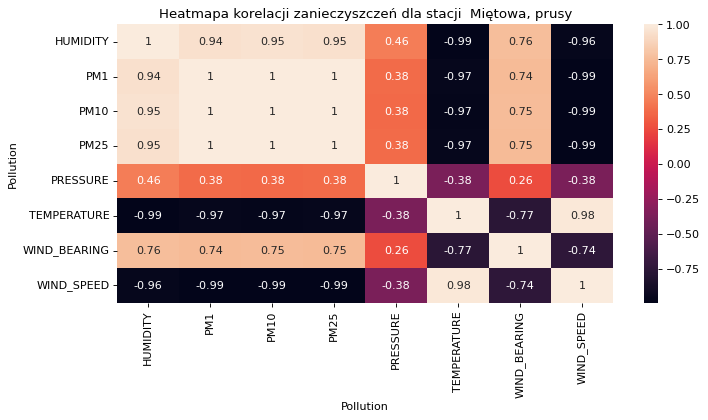

Korelacje zanieczyszczeń dla stacji  Miętowa, prusy


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


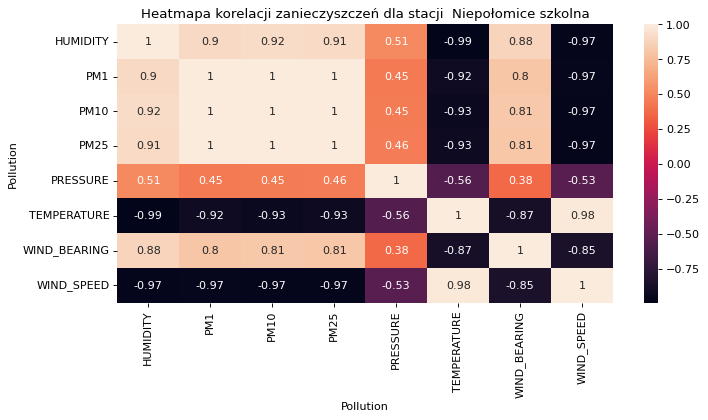

Korelacje zanieczyszczeń dla stacji  Niepołomice szkolna


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


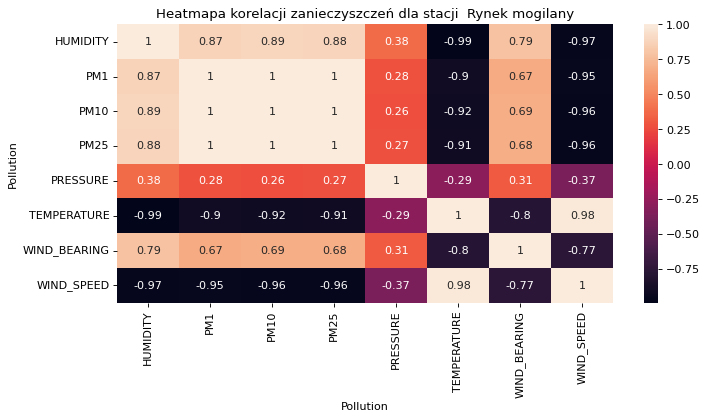

Korelacje zanieczyszczeń dla stacji  Rynek mogilany


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


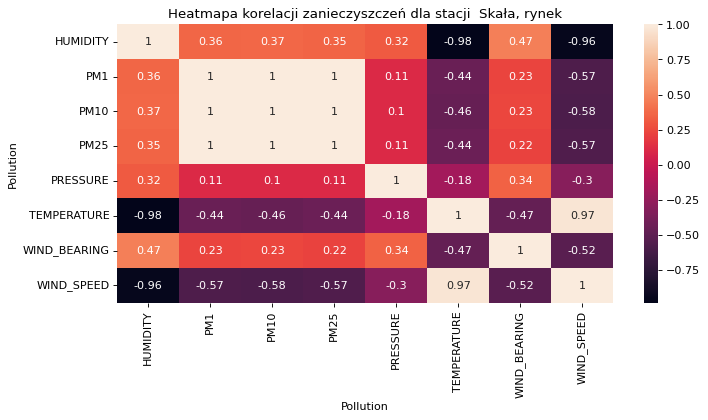

Korelacje zanieczyszczeń dla stacji  Skała, rynek


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


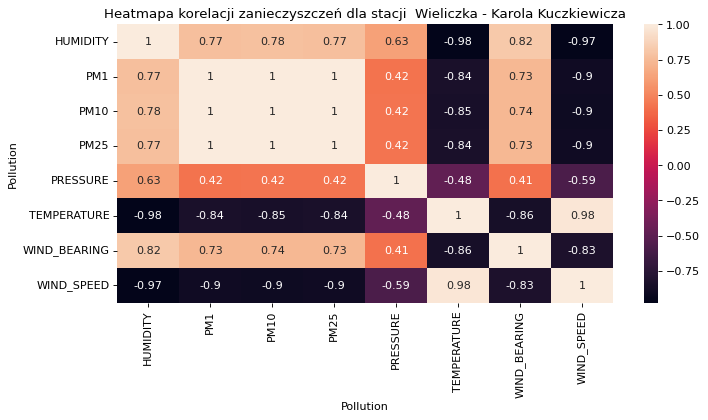

Korelacje zanieczyszczeń dla stacji  Wieliczka - Karola Kuczkiewicza


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


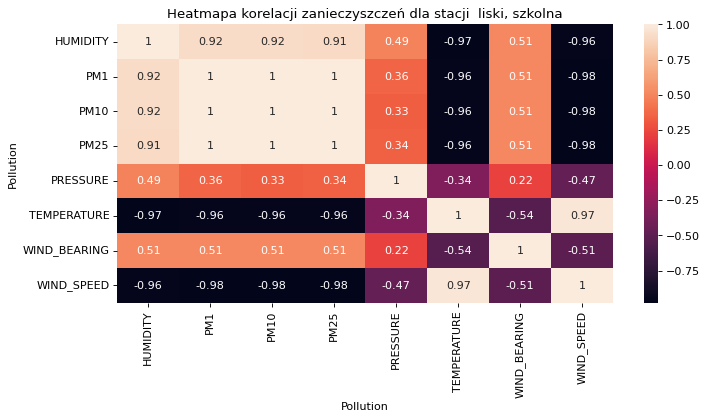

Korelacje zanieczyszczeń dla stacji  liski, szkolna


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


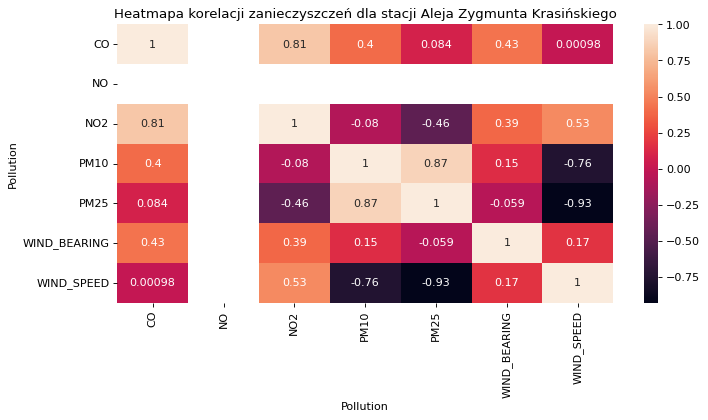

Korelacje zanieczyszczeń dla stacji Aleja Zygmunta Krasińskiego


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


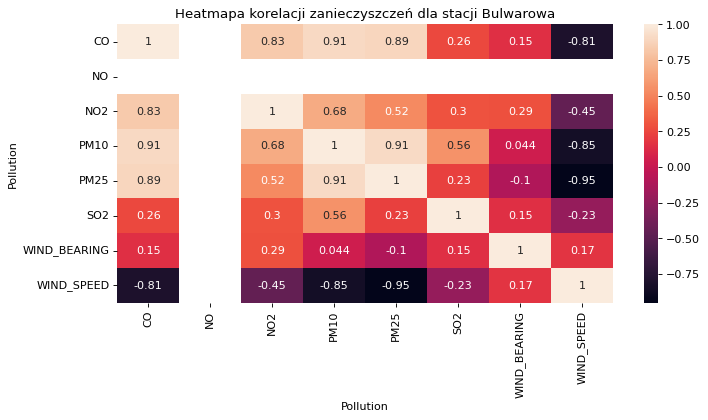

Korelacje zanieczyszczeń dla stacji Bulwarowa


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


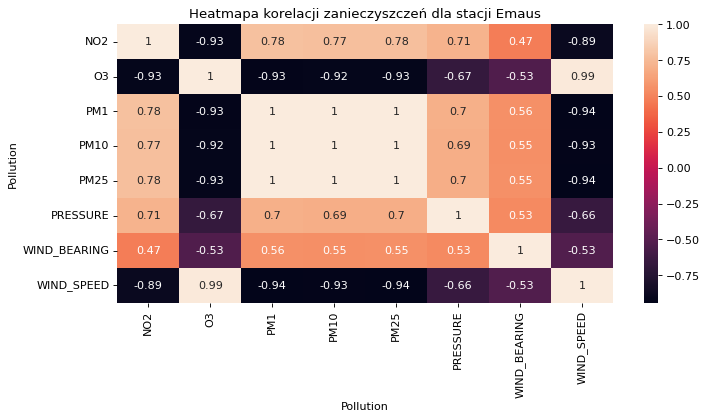

Korelacje zanieczyszczeń dla stacji Emaus


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


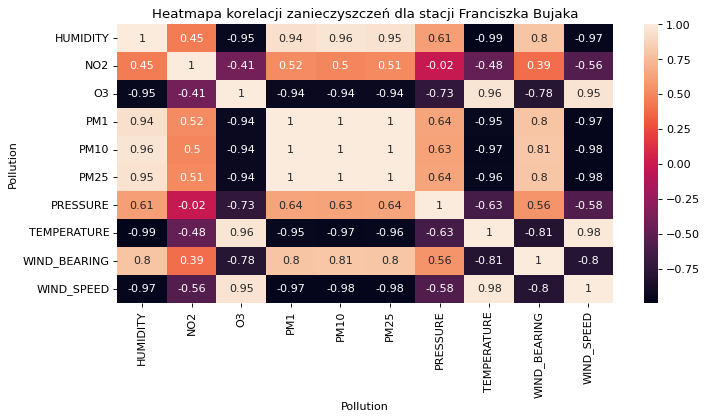

Korelacje zanieczyszczeń dla stacji Franciszka Bujaka


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


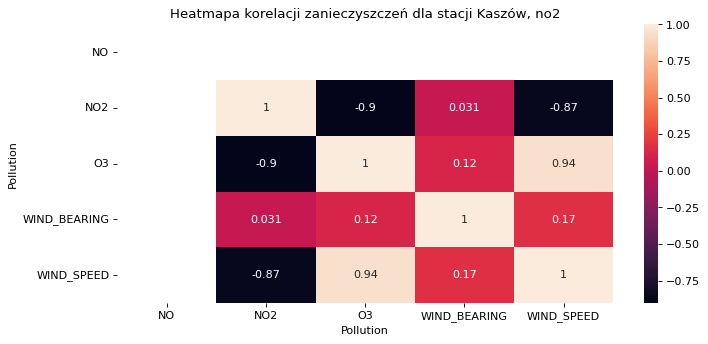

Korelacje zanieczyszczeń dla stacji Kaszów, no2


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


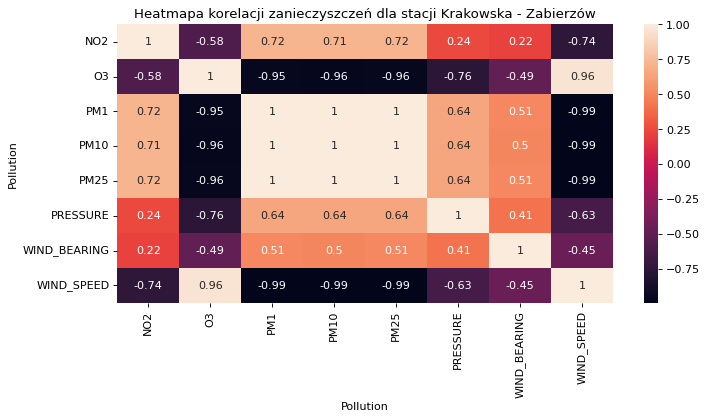

Korelacje zanieczyszczeń dla stacji Krakowska - Zabierzów


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


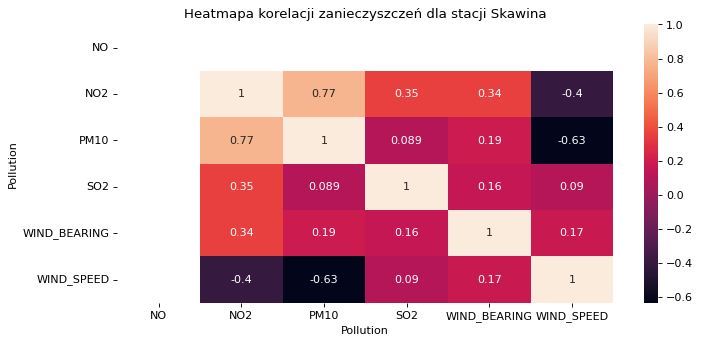

Korelacje zanieczyszczeń dla stacji Skawina


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


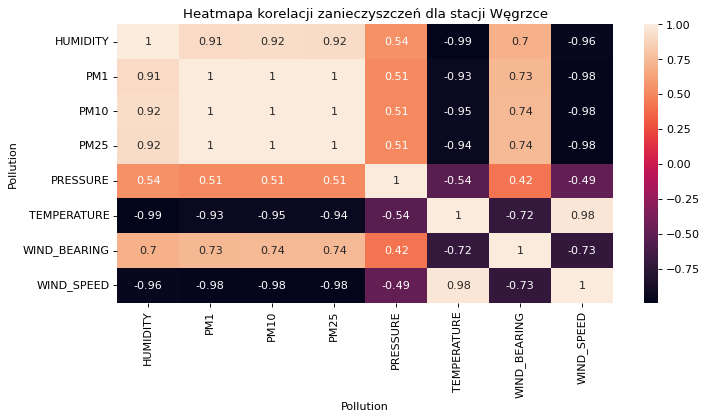

Korelacje zanieczyszczeń dla stacji Węgrzce


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\3554910876.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Value'] = data_scaled


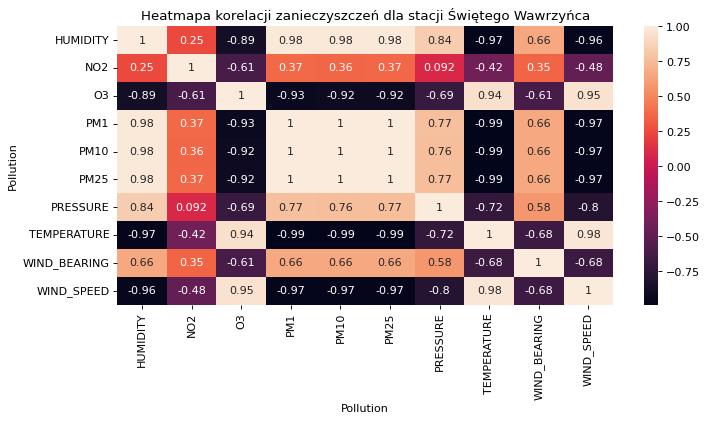

Korelacje zanieczyszczeń dla stacji Świętego Wawrzyńca


In [110]:
from sklearn.preprocessing import StandardScaler

stations = df_m['Station'].unique()

docxSaver = DocxSaver("Korelacje", 6)

for station in stations:
    # filtrowanie danych tylko dla danej stacji
    data = df_m[df_m['Station'] == station]
    
    # Standaryzowanie danych
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data[['Value']])
    data['Value'] = data_scaled
    
    #plt.figure(figsize=(6,5), dpi=80)
    fig, ax = plt.subplots(figsize=(10,6), dpi=80)

    # tworzenie macierzy korelacji
    corr = data.pivot_table(values='Value', columns='Pollution', index='Hours').corr()
    
    # tworzenie heatmapy
    sns.heatmap(corr, annot=True)
    ax.set_title(f'Heatmapa korelacji zanieczyszczeń dla stacji {station}')

    plt.subplots_adjust(bottom=0.3)
    plt.show()
    
    # wyświetlanie korelacji
    print(f"Korelacje zanieczyszczeń dla stacji {station}")

    docxSaver.appendImageToDocx(fig)
docxSaver.saveDocx()

Korelacje w innych punktach pomiarowych przyjmują różne wartości. Mimo wszystko da się zauważyć kilka wzorców:

- Wraz ze wzrostem temperatury maleje poziom zanieczyszczeń PM1, PM10, PM25 - może być to związane z mniejszymi potrzebami grzewczymi

- Dodatnia korelacja ciśnienia oraz pomiarów PM1, PM10, PM25

- Bliska -1 korelacja O3 z innymi pomiarami

- Słaba korelacja SO2 z innymi pomiarami

### Średnie dla stacji

In [111]:
mean_pollution = df_m.groupby(['Station', 'Pollution'])['Value'].mean().reset_index()

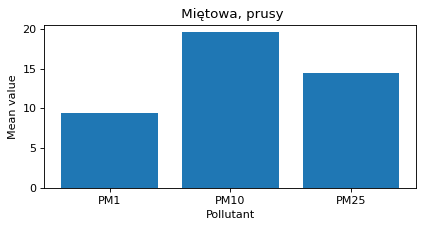

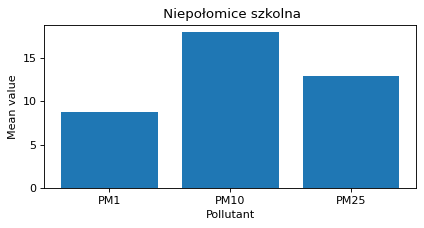

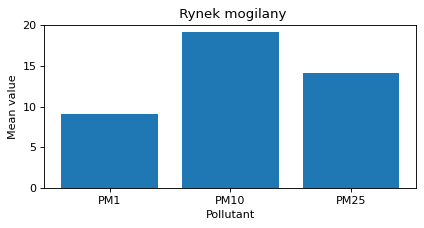

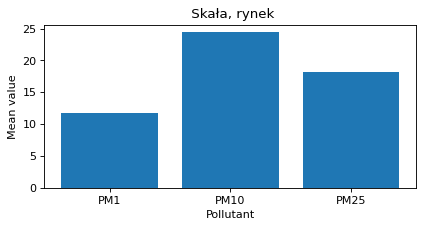

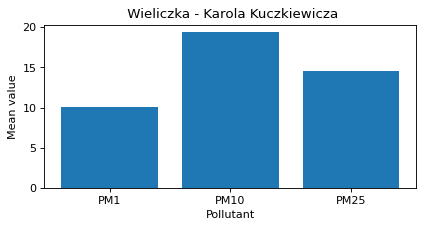

...

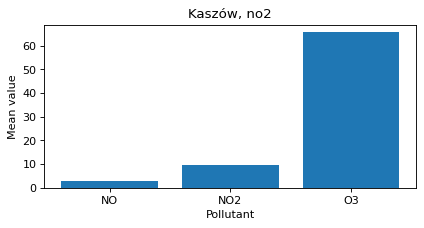

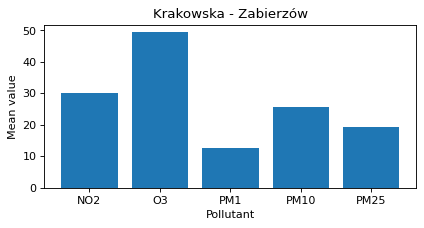

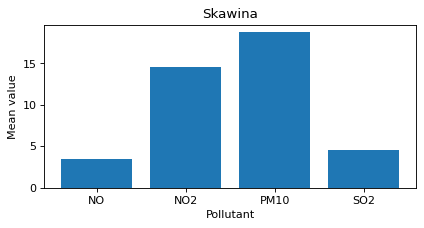

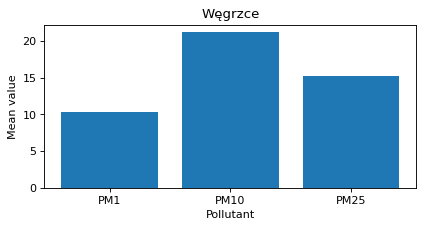

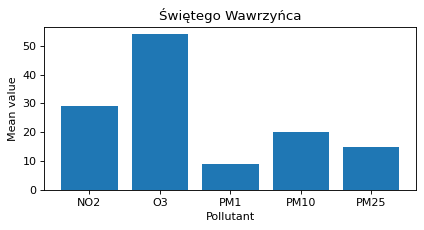

In [112]:
docxSaver = DocxSaver("wykresy dla każdej stacji", 6)

# wykresy dla każdej stacji
for station in df_m['Station'].unique():
    station_data = mean_pollution[mean_pollution['Station'] == station]
    station_data = station_data.query('Pollution != "HUMIDITY" and Pollution != "PRESSURE" and Pollution != "TEMPERATURE" and Pollution != "WIND_BEARING" and Pollution != "WIND_SPEED"')

    
    pollutants = station_data['Pollution'].values

    values = station_data['Value']
    
    fig, ax = plt.subplots(figsize=(6,3), dpi=80)

    ax.bar(pollutants, values)
    ax.set_title(station)
    ax.set_xlabel('Pollutant')
    ax.set_ylabel('Mean value')
    plt.subplots_adjust(bottom=0.2)
    
    plt.show()

    docxSaver.appendImageToDocx(fig)
docxSaver.saveDocx()

### Średnie dla zanieczyszczenia

C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\596749977.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_pollution_data = pollution_data.groupby(['Station', 'Pollution']).mean().reset_index()


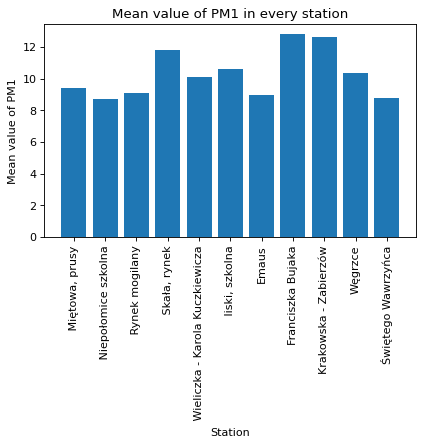

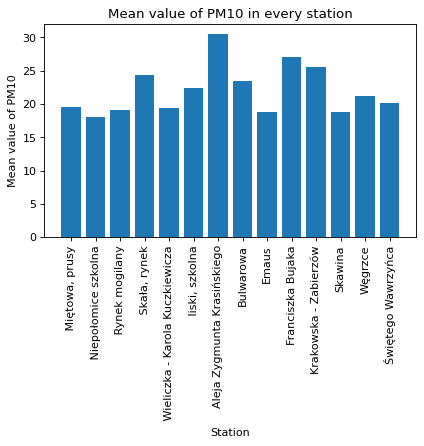

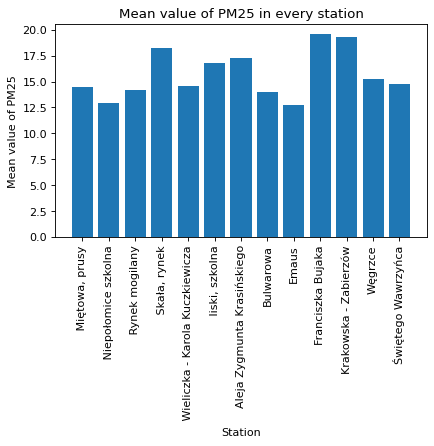

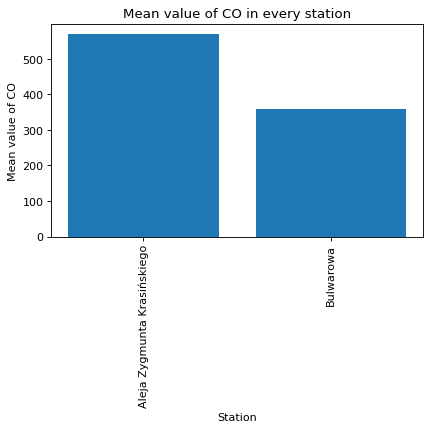

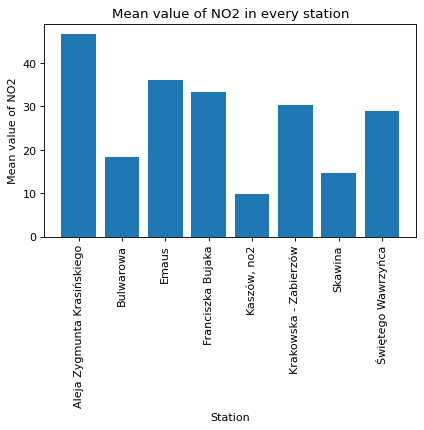

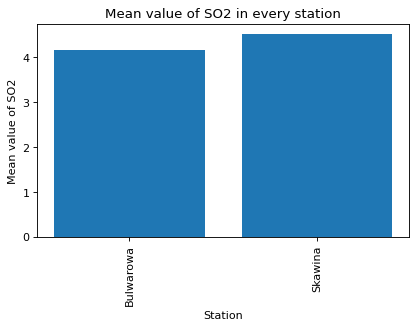

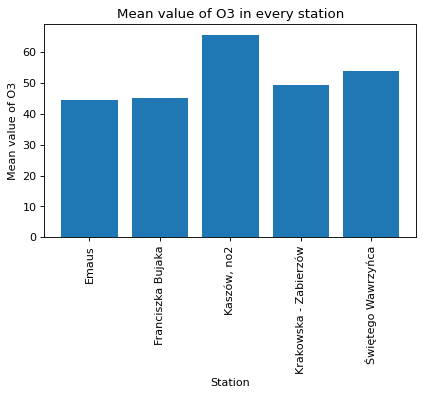

In [113]:
# wybieramy tylko wiersze z danymi zanieczyszczeń
pollution_data = df_m[df_m['Pollution'].isin(['PM1', 'PM10', 'PM25', 'CO', 'NO2', 'SO2', 'O3'])]

# grupujemy dane po stacji pomiarowej i typie zanieczyszczenia i obliczamy średnią wartość
mean_pollution_data = pollution_data.groupby(['Station', 'Pollution']).mean().reset_index()

docxSaver = DocxSaver("Średnie dla zanieczyszczenia")

# wykreślamy wyniki
for pollution in ['PM1', 'PM10', 'PM25', 'CO', 'NO2', 'SO2', 'O3']:
    fig, ax = plt.subplots(figsize=(6,7), dpi=80)
    ax.set_title(f"Mean value of {pollution} in every station")
    ax.set_xlabel("Station")
    ax.set_ylabel(f"Mean value of {pollution}")
    ax.bar(mean_pollution_data[mean_pollution_data['Pollution']==pollution]['Station'],
    mean_pollution_data[mean_pollution_data['Pollution']==pollution]['Value'])
    plt.xticks(rotation=90)
    plt.subplots_adjust(bottom=0.5)
    plt.show()
    
    docxSaver.appendImageToDocx(fig)
docxSaver.saveDocx()

Na powyższych wykresach da się zauażyć, że niektóre stacje osiągają większe średnie wartości dla wszystkich zanieczyszczeń. Są to stacje np. Krakowska - Zabierzów, Węgrzce, Aleja Zygmunta Krasińskiego oraz Skała, Rynek.

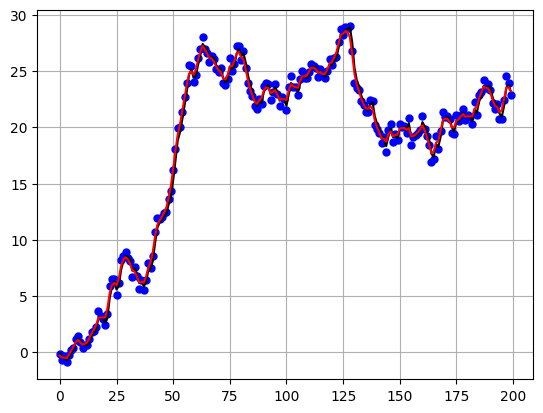

In [114]:
#!pip3 install minkf
import numpy as np
import minkf as kf
import matplotlib.pyplot as plt

y = np.cumsum(np.random.standard_normal(200))

x0 = np.array([0.0])
Cest0 = 1*np.array([[1.0]])

M = np.array([[1.0]])
K = np.array([[1.0]])
Q = 0.1*np.array([[1.0]])
R = 0.1*np.array([[1.0]])

res = kf.run_filter(y, x0, Cest0, M, K, Q, R, likelihood=True)
res_smo = kf.run_smoother(y, x0, Cest0, M, K, Q, R)

plt.figure()
plt.plot(y, 'bo', ms=5)
plt.plot(res['x'], 'k-')
plt.plot(res_smo['x'], 'r-')
plt.grid(True)
plt.show()

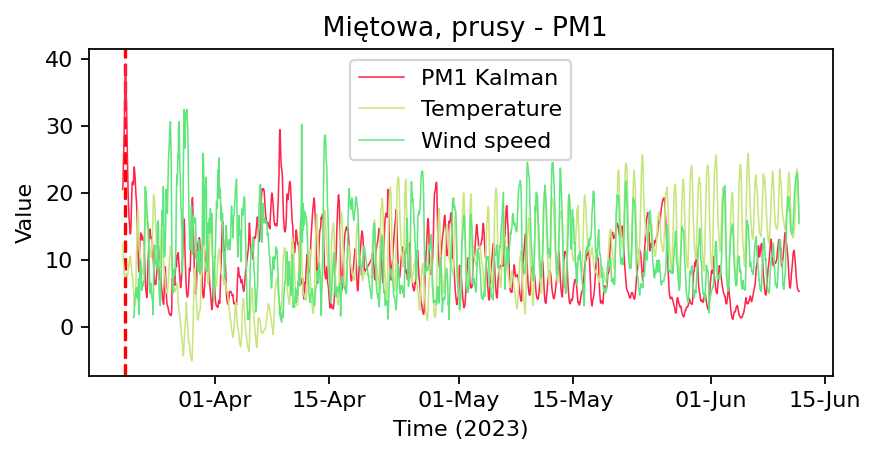

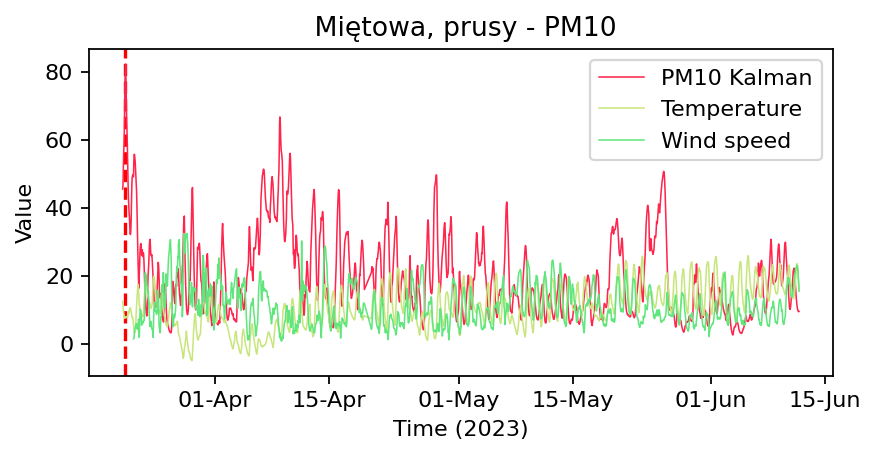

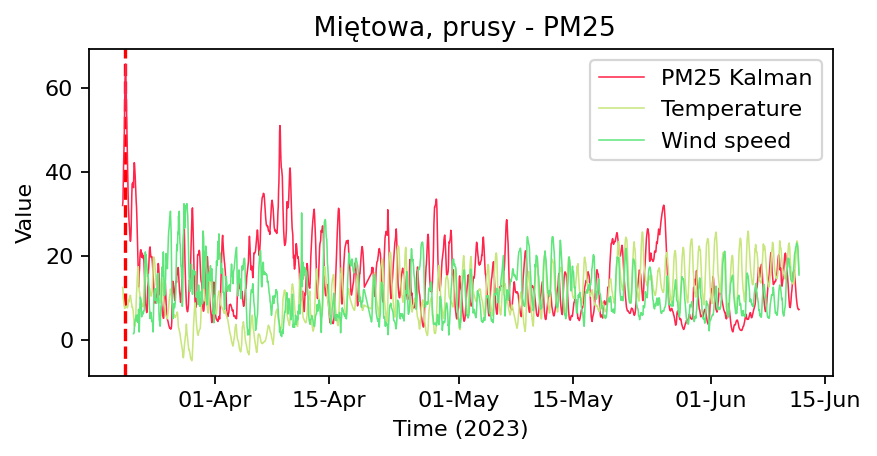

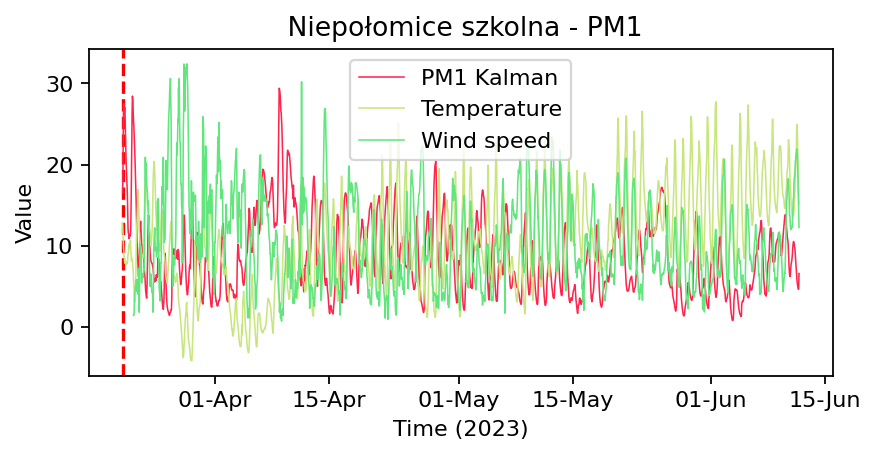

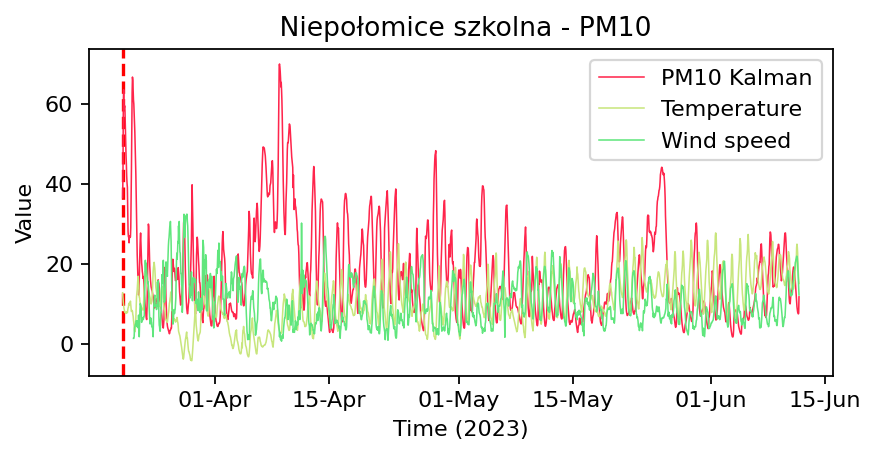

...

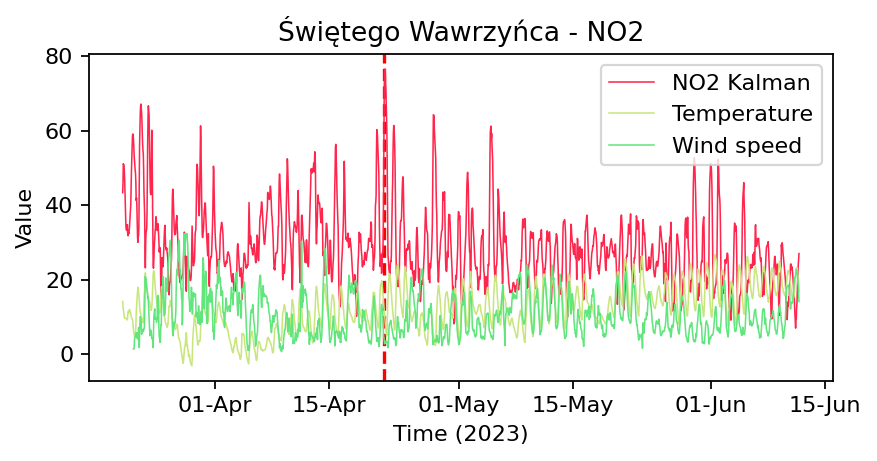

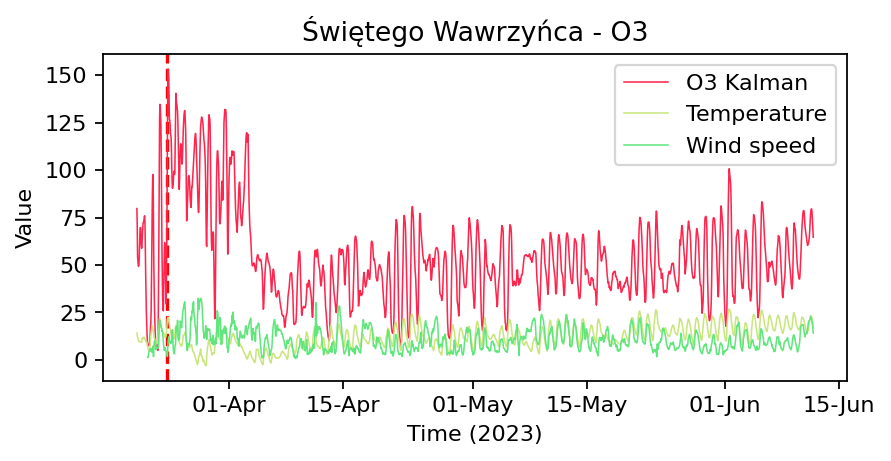

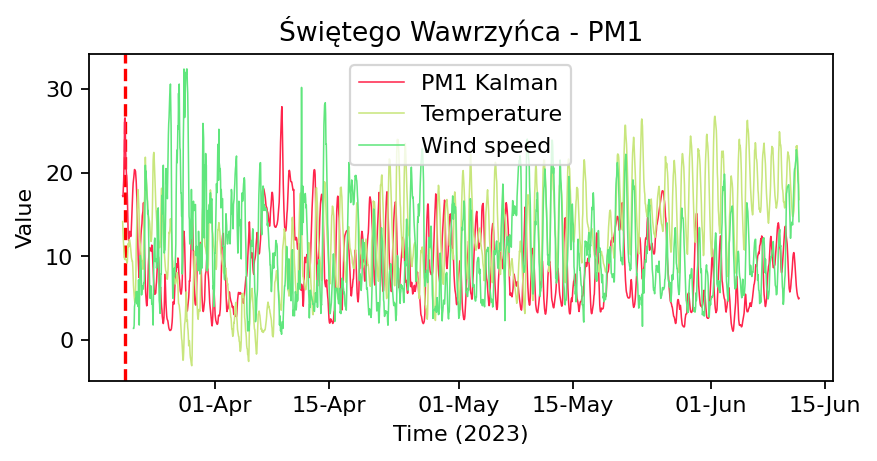

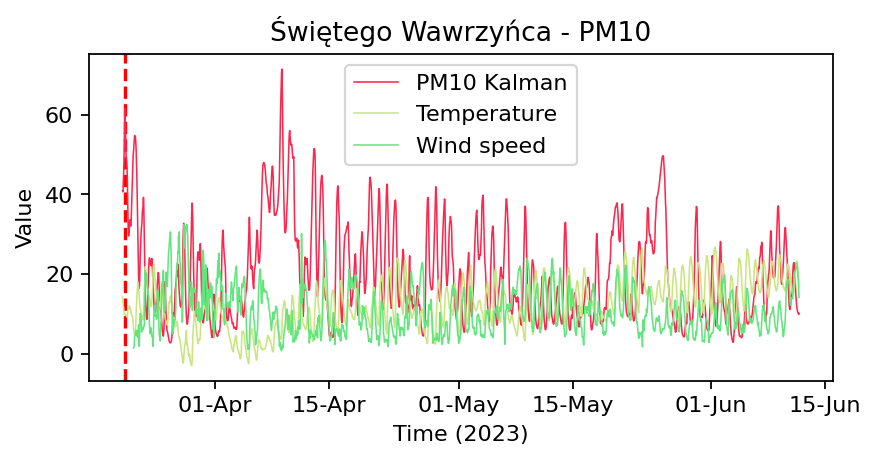

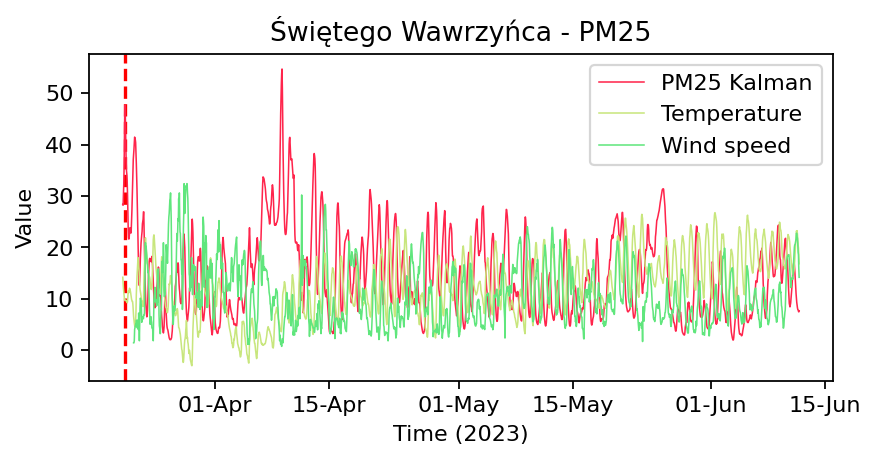

In [115]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import minkf as kf
docxSaver = DocxSaver("Zanieczyszczenia z temperaturą")

linewidth = 0.7

# iterujemy po unikalnych stacjach
for station in df_m['Station'].unique():
    # wybieramy tylko dane dla danej stacji
    df_station = df_m[df_m['Station'] == station]
    # iterujemy po unikalnych typach zanieczyszczeń
    for pollution in df_station['Pollution'].unique():
        if pollution not in ['HUMIDITY', 'WIND_SPEED', 'TEMPERATURE', 'WIND_BEARING', 'PRESSURE']:
            # tworzymy nowy wykres
            fig, ax = plt.subplots(figsize=(6,3), dpi=160)
            # wybieramy tylko dane dla danej stacji i danego typu zanieczyszczenia
            df_pollution = df_station[df_station['Pollution'] == pollution]

            # znajdujemy wartość maksymalną i odpowiadający jej czas
            idx_max = df_pollution['Value'].idxmax()
            x_max = df_pollution.loc[idx_max, 'Time']
            y_max = df_pollution.loc[idx_max, 'Value']

            # dodajemy kreskę pionową
            ax.axvline(x=x_max, color='red', linestyle='--')
            
            # Bez filtra
            # dodajemy linię dla zanieczyszczenia
            #ax.plot(df_pollution['Time'].to_numpy(), df_pollution['Value'].to_numpy(), label=pollution)

            # -----  Syf z filtrem

            # filtracja Kalmana dla zanieczyszczenia
            y = df_pollution['Value'].to_numpy()
            
            x0 = np.array([y[0]])
            Cest0 = 1*np.array([[1.0]])
            M = np.array([[1.0]])
            K = np.array([[1.0]])
            Q = 0.1*np.array([[1.0]])
            
            # errorek 
            errorek = 1
            R = errorek*np.array([[1.0]])
            
            res = kf.run_filter(y, x0, Cest0, M, K, Q, R, likelihood=True)
            smoothed_pollution = res['x']
            # rysujemy wykres dla zanieczyszczenia po filtracji Kalmana
            ax.plot(df_pollution['Time'].to_numpy(), smoothed_pollution, label=pollution + ' Kalman', linewidth=linewidth, color='#FF254C')
        
        
            # ----- Temperatura

            # wybieramy tylko dane dla danej stacji i temperatury
            df_temp = df_station[df_station['Pollution'] == 'TEMPERATURE']
            # dodajemy linię dla temperatury
            ax.plot(df_temp['Time'].to_numpy(), df_temp['Value'].to_numpy(), label='Temperature', linewidth=linewidth, color='#C8E67D')   
        
        
            # ----- Wiater
            
            # wybieramy tylko dane dla danej stacji i temperatury
            df_temp = df_station[df_station['Pollution'] == 'WIND_SPEED']
            # dodajemy linię dla temperatury
            ax.plot(df_temp['Time'].to_numpy(), df_temp['Value'].to_numpy(), label='Wind speed', linewidth=linewidth, color='#60E67D')
            
        
            # dodajemy tytuł i etykiety osi
            ax.set_title(f'{station} - {pollution}')
            ax.set_xlabel('Time (2023)')
            ax.set_ylabel('Value')
            # dodajemy legendę
            ax.legend()
            #plt.xticks(rotation = 45, )

            # Formatuje dla dnia i miesiąca format daty
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
            plt.subplots_adjust(bottom=0.2)
            
            # wyświetlamy wykres
            plt.show()
            docxSaver.appendImageToDocx(fig)
docxSaver.saveDocx()

### Violin plots pomiarów PM1, PM10, PM2.5 dla każdej stacji

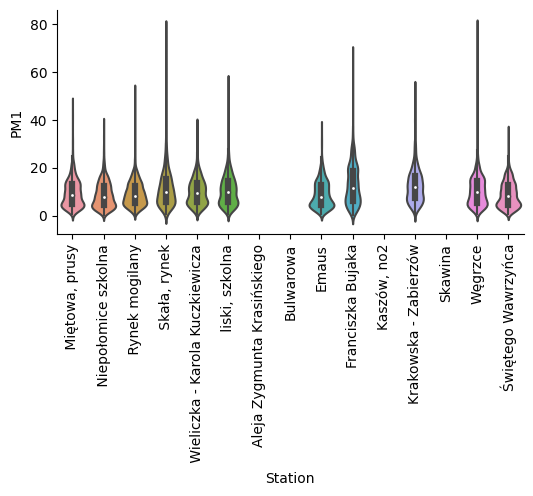

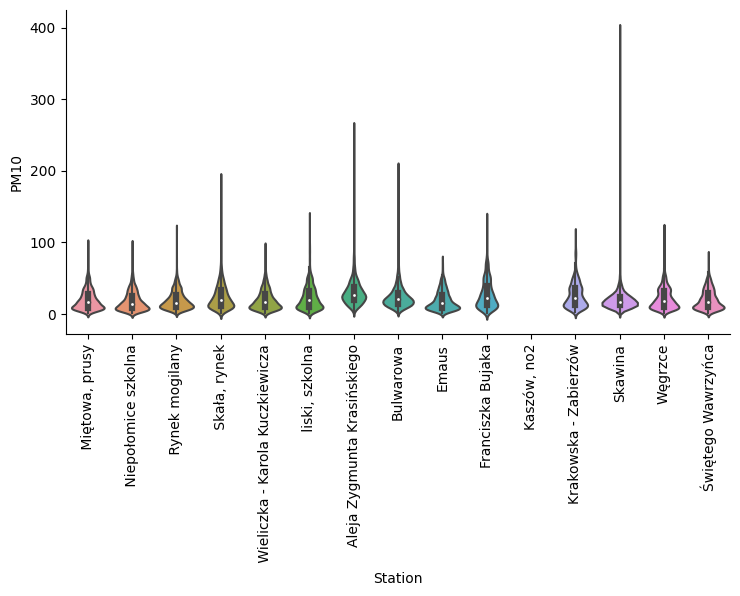

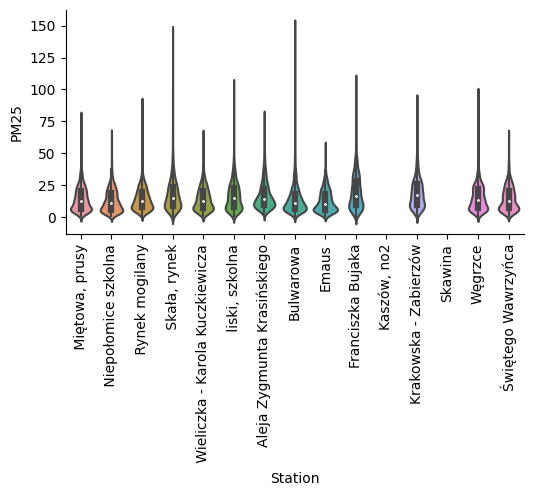

In [116]:
# przekształcenie danych przy użyciu funkcji pivot
df_pivot = df_m.pivot(index=['Time', 'Station', 'Timestamp', 'WeekDay', 'Hours'], columns='Pollution', values='Value').reset_index()

# wygenerowanie osobnych wykresów violina dla każdego rodzaju zanieczyszczenia
pm1_plot = sns.catplot(x='Station', y='PM1', kind='violin', data=df_pivot, height=3, aspect=2)
pm10_plot = sns.catplot(x='Station', y='PM10', kind='violin', data=df_pivot, height=4, aspect=2)
pm25_plot = sns.catplot(x='Station', y='PM25', kind='violin', data=df_pivot, height=3, aspect=2)
# obrócenie podpisów osi x o 90 stopni
pm1_plot.set_xticklabels(rotation=90)
pm10_plot.set_xticklabels(rotation=90)
pm25_plot.set_xticklabels(rotation=90)

### Wiatr

In [117]:
#zamiana stopni na kategoryczną zmienną kierunków świata
df_m.loc[df_m['Pollution'] == 'WIND_BEARING', 'Value'] = df_m.loc[df_m['Pollution'] == 'WIND_BEARING', 'Value'].round(-1) % 360 // 45

Kierunek wiatru to liczby 0-7 odpowiadające N, NE, E, SE, S, SW, W, NW.

In [118]:
NUMBER_TO_DIRECTION = {
    0: "N",
    1: "NE",
    2: "E",
    3: "SE",
    4: "S",
    5: "SW",
    6: "W",
    7: "NW",
}

Most popular wind directions:
N: 2727
NE: 6007
E: 3151
SE: 702
S: 1936
SW: 3273
W: 3780
NW: 1492


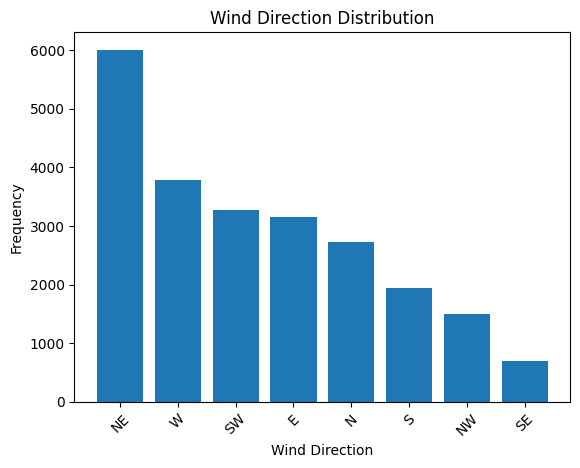

In [119]:
counts = df_m[df_m["Pollution"] == "WIND_BEARING"]['Value'].value_counts()
print("Most popular wind directions:")
for number, direction in NUMBER_TO_DIRECTION.items():
    print(f"{direction}: {counts[number]}")
    
# Extract the direction labels and counts
directions = [NUMBER_TO_DIRECTION[number] for number in counts.index]
frequency = counts.values

# Create a bar plot
plt.bar(directions, frequency)
plt.xlabel('Wind Direction')
plt.ylabel('Frequency')
plt.title('Wind Direction Distribution')

# Rotate the x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Display the histogram
plt.show()
    

Najczęściej występujący na dany moment był wiatr wschodni.

In [120]:
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import matplotlib.dates as mdates


#docxSaver = DocxSaver("Wiatr")

data = df_m[42627:]
# iterujemy po unikalnych stacjach
for station in data['Station'].unique():
    break
    # wybieramy tylko dane dla danej stacji
    df_station = data[data['Station'] == station]
    # iterujemy po unikalnych typach zanieczyszczeń
    for pollution in df_station['Pollution'].unique():
        if pollution not in ['HUMIDITY', 'WIND_SPEED', 'TEMPERATURE', 'WIND_BEARING', 'PRESSURE']:
            # tworzymy nowy wykres
            fig, ax = plt.subplots(figsize=(6,3), dpi=80)
            # wybieramy tylko dane dla danej stacji i danego typu zanieczyszczenia
            df_pollution = df_station[df_station['Pollution'] == pollution]

            # znajdujemy wartość maksymalną i odpowiadający jej czas
            idx_max = df_pollution['Value'].idxmax()
            x_max = df_pollution.loc[idx_max, 'Time']
            y_max = df_pollution.loc[idx_max, 'Value']

            # dodajemy kreskę pionową
            ax.axvline(x=x_max, color='red', linestyle='--')
            # dodajemy linię dla zanieczyszczenia
            ax.plot(df_pollution['Time'].to_numpy(), df_pollution['Value'].to_numpy(), label=pollution)

            # wybieramy tylko dane dla danej stacji i temperatury
            df_temp = df_station[df_station['Pollution'] == 'WIND_SPEED']
            # dodajemy linię dla temperatury
            ax.plot(df_temp['Time'].to_numpy(), df_temp['Value'].to_numpy(), label='WIND SPEED')
            
        
            # dodajemy tytuł i etykiety osi
            ax.set_title(f'{station} - {pollution}')
            ax.set_xlabel('Time (2023)')
            ax.set_ylabel('Value')
            # dodajemy legendę
            ax.legend()
            #plt.xticks(rotation = 45, )
            
            # Formatuje dla dnia i miesiąca format daty
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
            plt.subplots_adjust(bottom=0.2)

            # wyświetlamy wykres
            plt.show()
            docxSaver.appendImageToDocx(fig)
docxSaver.saveDocx()

In [121]:
df_wind_bearing = df_m.loc[df_m['Pollution'] == 'WIND_BEARING']
wind_bearings = list(df_wind_bearing['Value'])
df_pollution = df_m.loc[df_m['Pollution'].isin(['PM1', 'PM10', 'PM25'])]
df_mean = df_pollution.groupby([pd.Series(wind_bearings, name='wind_bearing'), 'Pollution'])['Value'].mean()
df_mean

wind_bearing  Pollution
0.0           PM1           9.896996
              PM10         23.530527
              PM25         15.280413
1.0           PM1           9.628014
              PM10         20.151843
              PM25         14.706975
2.0           PM1           7.584636
              PM10         17.021877
              PM25         11.647431
3.0           PM1          10.708873
              PM10         20.569943
              PM25         16.443403
4.0           PM1          18.114864
              PM10         40.091891
              PM25         29.664346
5.0           PM1          15.311767
              PM10         34.213661
              PM25         25.274415
6.0           PM1          12.102141
              PM10         25.954150
              PM25         18.844379
7.0           PM1          11.362245
              PM10         26.439129
              PM25         17.991192
Name: Value, dtype: float64

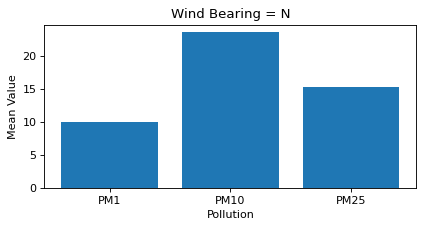

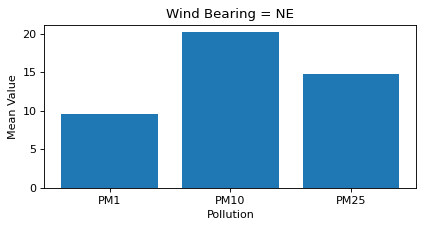

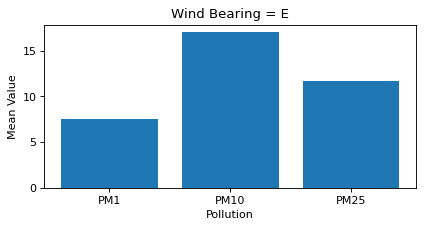

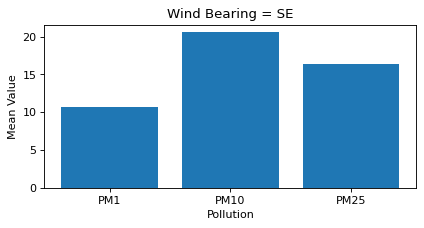

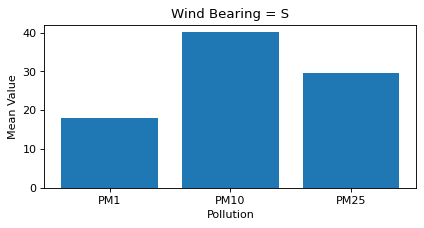

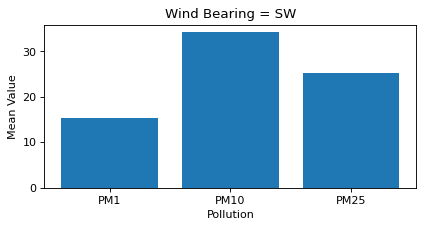

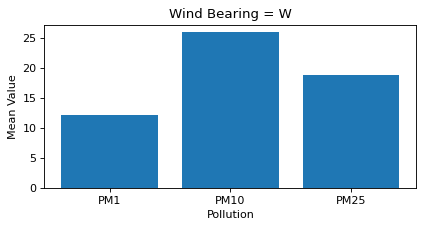

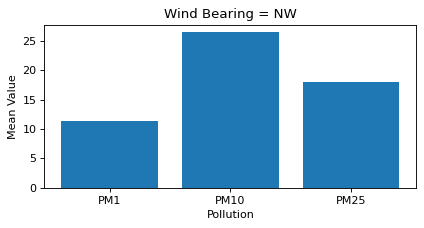

In [122]:
docxSaver = DocxSaver("Średnie zanieczyszczenie dla wiatru")

# tworzymy osobne wykresy dla każdej wartości wind_bearing
for wind_bearing in df_mean.index.levels[0]:   
    df_wind_bearing = df_mean.loc[wind_bearing].reset_index()
    fig, ax = plt.subplots(figsize=(6,3), dpi=80)
    ax.bar(df_wind_bearing['Pollution'], df_wind_bearing['Value'])
    ax.set_title(f"Wind Bearing = {NUMBER_TO_DIRECTION[wind_bearing]}")
    ax.set_xlabel('Pollution')
    ax.set_ylabel('Mean Value')
    plt.subplots_adjust(bottom=0.2)

    plt.show()
    
    docxSaver.appendImageToDocx(fig)
docxSaver.saveDocx()   

### Podział na Kraków i okolice

In [123]:
stations

array([' Miętowa, prusy', ' Niepołomice szkolna', ' Rynek mogilany',
       ' Skała, rynek', ' Wieliczka - Karola Kuczkiewicza',
       ' liski, szkolna', 'Aleja Zygmunta Krasińskiego', 'Bulwarowa',
       'Emaus', 'Franciszka Bujaka', 'Kaszów, no2',
       'Krakowska - Zabierzów', 'Skawina', 'Węgrzce',
       'Świętego Wawrzyńca'], dtype=object)

In [124]:
stationsCracow = ['Franciszka Bujaka', 'Świętego Wawrzyńca', 'Bulwarowa', 'Emaus', 'Aleja Zygmunta Krasińskiego']
statsionNeighberhood =  [' Miętowa, prusy', ' Niepołomice szkolna', ' Rynek mogilany',
       ' Skała, rynek', ' Wieliczka - Karola Kuczkiewicza', 'Skawina', ' liski, szkolna','Kaszów, no2',
       'Krakowska - Zabierzów', 'Węgrzce' ]

In [125]:
# podział względem lokalizacji stacji
df_Cracow = df_m[df_m['Station'].isin(stationsCracow)]
df_Neighberhood = df_m[df_m['Station'].isin(statsionNeighberhood)]

In [126]:
df_Cracow.shape[0] + df_Neighberhood.shape[0] == df_m.shape[0]
# zgadza się

True

In [127]:
import pandas as pd

df_Cracow['Average_Value'] = df_Cracow.groupby(['Time', 'Pollution'])['Value'].transform('mean')
df_Neighberhood['Average_Value'] = df_Neighberhood.groupby(['Time', 'Pollution'])['Value'].transform('mean')


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\816873096.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Cracow['Average_Value'] = df_Cracow.groupby(['Time', 'Pollution'])['Value'].transform('mean')
C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\816873096.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Neighberhood['Average_Value'] = df_Neighberhood.groupby(['Time', 'Pollution'])['Value'].transform('mean')


In [128]:
df_Cracow.head()

,Time,Station,Pollution,Value,Timestamp,WeekDay,Hours,Average_Value
36,2023-03-20 16:00:00,Aleja Zygmunta Krasińskiego,CO,661.51,466480,0,16,585.965
37,2023-03-20 16:00:00,Aleja Zygmunta Krasińskiego,NO2,61.43,466480,0,16,43.436
38,2023-03-20 16:00:00,Aleja Zygmunta Krasińskiego,PM10,51.34,466480,0,16,46.098
39,2023-03-20 16:00:00,Aleja Zygmunta Krasińskiego,PM25,34.74,466480,0,16,32.146
40,2023-03-20 16:00:00,Bulwarowa,CO,510.42,466480,0,16,585.965


In [129]:
df_Cracow_unique  = df_Cracow.drop_duplicates(subset=['Time', 'Pollution'])
df_Neighberhood_unique  = df_Neighberhood.drop_duplicates(subset=['Time', 'Pollution'])

In [130]:
df_Cracow_unique = df_Cracow_unique.drop(df_Cracow_unique.columns[[1, 3,4, 5,6]], axis=1)
df_Neighberhood_unique = df_Neighberhood_unique.drop(df_Neighberhood_unique.columns[[1, 3,4, 5,6]], axis=1)

In [131]:
df_Cracow_unique.head()

,Time,Pollution,Average_Value
36,2023-03-20 16:00:00,CO,585.965
37,2023-03-20 16:00:00,NO2,43.436
38,2023-03-20 16:00:00,PM10,46.098
39,2023-03-20 16:00:00,PM25,32.146
44,2023-03-20 16:00:00,SO2,3.670


#### Korelacja

In [132]:
df_m['Pollution'].unique()

array(['HUMIDITY', 'PM1', 'PM10', 'PM25', 'PRESSURE', 'TEMPERATURE', 'CO',
       'NO2', 'SO2', 'O3', 'WIND_BEARING', 'WIND_SPEED', 'NO'],
      dtype=object)

In [133]:
df_Cracow_unique_PM1_fresh = df_Cracow_unique[df_Cracow_unique['Pollution'] == 'PM1']
df_Cracow_unique_PM10_fresh = df_Cracow_unique[df_Cracow_unique['Pollution'] == 'PM10']
df_Cracow_unique_PM25_fresh = df_Cracow_unique[df_Cracow_unique['Pollution'] == 'PM25']

In [134]:
df_Neighberhood_unique_PM1_fresh = df_Neighberhood_unique[df_Neighberhood_unique['Pollution'] == 'PM1']
df_Neighberhood_unique_PM10_fresh = df_Neighberhood_unique[df_Neighberhood_unique['Pollution'] == 'PM10']
df_Neighberhood_unique_PM25_fresh = df_Neighberhood_unique[df_Neighberhood_unique['Pollution'] == 'PM25']

In [135]:
df_Neighberhood_unique_PM1 = df_Neighberhood_unique_PM1_fresh.drop(columns = ['Time', 'Pollution'])
df_Cracow_unique_PM1 = df_Cracow_unique_PM1_fresh.drop(columns = ['Time', 'Pollution'])
df_Neighberhood_unique_PM10 = df_Neighberhood_unique_PM10_fresh.drop(columns = ['Time', 'Pollution'])
df_Cracow_unique_PM10 = df_Cracow_unique_PM10_fresh.drop(columns = ['Time', 'Pollution'])
df_Neighberhood_unique_PM25 = df_Neighberhood_unique_PM25_fresh.drop(columns = ['Time', 'Pollution'])
df_Cracow_unique_PM25 = df_Cracow_unique_PM25_fresh.drop(columns = ['Time', 'Pollution'])

In [136]:
df_Neighberhood_unique_PM25

,Average_Value
3,42.46375
86,43.94125
169,52.69375
252,60.19875
335,53.69625
...,...
209385,6.97875
209491,7.57875
209597,7.52625
209703,8.14625


In [137]:
df_Neighberhood_unique_PM1 = df_Neighberhood_unique_PM1[:-1]
df_Neighberhood_unique_PM0 = df_Neighberhood_unique_PM10[:-1]
df_Neighberhood_unique_PM25 = df_Neighberhood_unique_PM25[:-1]

In [138]:
df_Cracow_unique_PM1 = df_Cracow_unique_PM1.reset_index(drop=True)
df_Cracow_unique_PM10 = df_Cracow_unique_PM10.reset_index(drop=True)
df_Cracow_unique_PM25 = df_Cracow_unique_PM25.reset_index(drop=True)
df_Neighberhood_unique_PM1 = df_Neighberhood_unique_PM1.reset_index(drop=True)
df_Neighberhood_unique_PM10 = df_Neighberhood_unique_PM10.reset_index(drop=True)
df_Neighberhood_unique_PM25 = df_Neighberhood_unique_PM25.reset_index(drop=True)

In [139]:
df_merged_PM1 = pd.concat([df_Cracow_unique_PM1, df_Neighberhood_unique_PM1], axis=1)
df_merged_PM10 = pd.concat([df_Cracow_unique_PM10, df_Neighberhood_unique_PM10], axis=1)
df_merged_PM25 = pd.concat([df_Cracow_unique_PM25, df_Neighberhood_unique_PM25], axis=1)

In [140]:
df_merged_PM1.columns.values[0] = 'Cracow'
df_merged_PM10.columns.values[0] = 'Cracow'
df_merged_PM25.columns.values[0] = 'Cracow'
df_merged_PM1.columns.values[1] = 'Neighberhood'
df_merged_PM10.columns.values[1] = 'Neighberhood'
df_merged_PM25.columns.values[1] = 'Neighberhood'

In [141]:
df_merged_PM1

,Cracow,Neighberhood
0,20.493333,26.50375
1,20.656667,27.48875
2,22.886667,32.45750
3,24.390000,39.41625
4,34.030000,33.34500
...,...,...
1991,5.293333,5.38875
1992,5.746667,5.25750
1993,5.626667,5.67000
1994,5.883333,5.52500


In [142]:
df_merged_PM1.corr()

,Cracow,Neighberhood
Cracow,1.00000,0.90286
Neighberhood,0.90286,1.00000


In [143]:
df_merged_PM10.corr()

,Cracow,Neighberhood
Cracow,1.000000,0.876703
Neighberhood,0.876703,1.000000


In [144]:
df_merged_PM25.corr()

,Cracow,Neighberhood
Cracow,1.000000,0.910903
Neighberhood,0.910903,1.000000


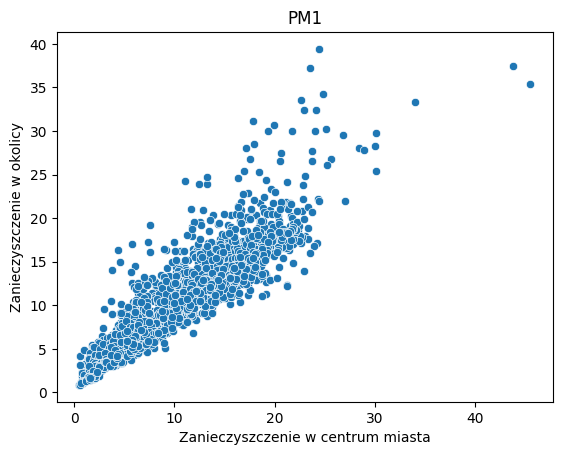

In [145]:
import matplotlib.pyplot as plt
import seaborn as sns

# Wykres punktowy
sns.scatterplot(x=df_merged_PM1['Cracow'], y=df_merged_PM1['Neighberhood'])
plt.xlabel('Zanieczyszczenie w centrum miasta')
plt.ylabel('Zanieczyszczenie w okolicy')
plt.title('PM1')
plt.show()

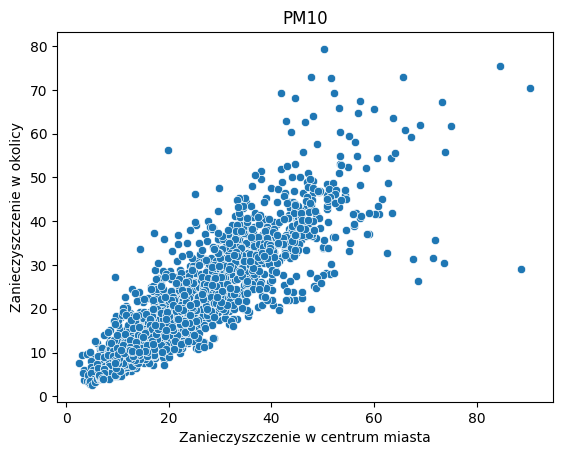

In [146]:
# Wykres punktowy
sns.scatterplot(x=df_merged_PM10['Cracow'], y=df_merged_PM10['Neighberhood'])
plt.xlabel('Zanieczyszczenie w centrum miasta')
plt.ylabel('Zanieczyszczenie w okolicy')
plt.title('PM10')
plt.show()

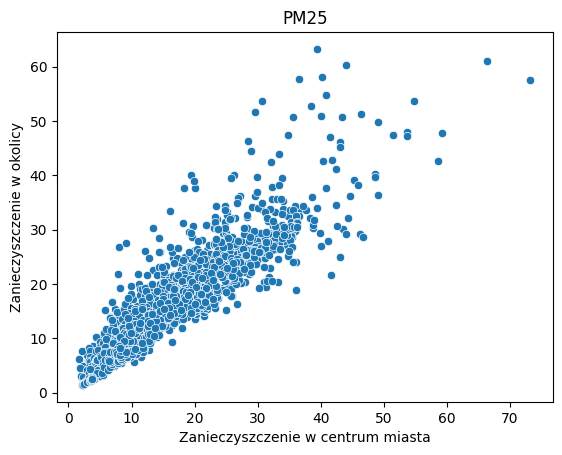

In [147]:
# Wykres punktowy
sns.scatterplot(x=df_merged_PM25['Cracow'], y=df_merged_PM25['Neighberhood'])
plt.xlabel('Zanieczyszczenie w centrum miasta')
plt.ylabel('Zanieczyszczenie w okolicy')
plt.title('PM25')
plt.show()

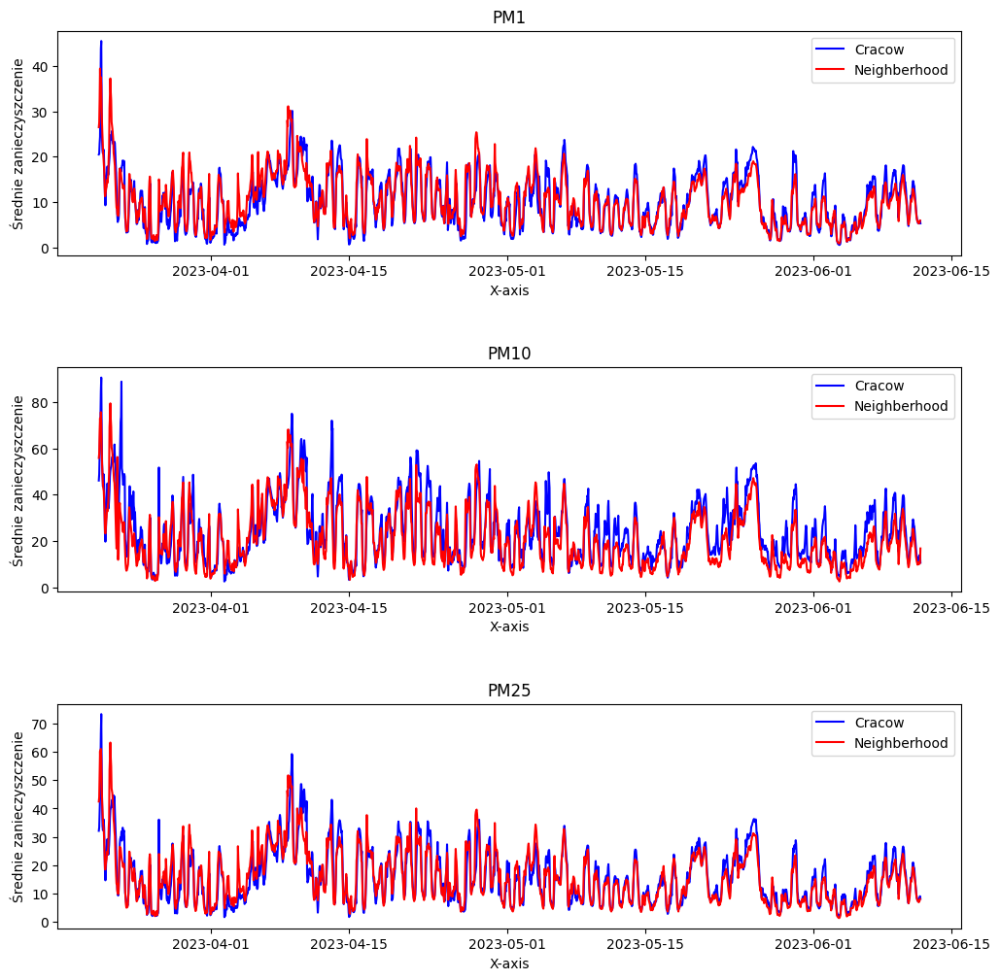

In [148]:
# Tworzenie wykresu
fig, axes = plt.subplots(3,1, figsize=(12, 12))
axes[0].plot(df_Cracow_unique_PM1_fresh['Time'].to_numpy(), df_merged_PM1['Cracow'], color='blue', label='Cracow')
axes[0].plot(df_Neighberhood_unique_PM1_fresh['Time'].to_numpy()[:-1], df_merged_PM1['Neighberhood'], color='red', label='Neighberhood')
axes[0].set_xlabel('X-axis')
axes[0].set_ylabel('Średnie zanieczyszczenie')
axes[0].set_title('PM1')
axes[0].legend()

axes[1].plot(df_Cracow_unique_PM10_fresh['Time'].to_numpy(), df_merged_PM10['Cracow'][:-1], color='blue', label='Cracow')
axes[1].plot(df_Neighberhood_unique_PM10_fresh['Time'].to_numpy(), df_merged_PM10['Neighberhood'], color='red', label='Neighberhood')
axes[1].set_xlabel('X-axis')
axes[1].set_ylabel('Średnie zanieczyszczenie')
axes[1].set_title('PM10')
axes[1].legend()

axes[2].plot(df_Cracow_unique_PM25_fresh['Time'].to_numpy(), df_merged_PM25['Cracow'], color='blue', label='Cracow')
axes[2].plot(df_Neighberhood_unique_PM25_fresh['Time'].to_numpy()[:-1], df_merged_PM25['Neighberhood'], color='red', label='Neighberhood')
axes[2].set_xlabel('X-axis')
axes[2].set_ylabel('Średnie zanieczyszczenie')
axes[2].set_title('PM25')
axes[2].legend()

plt.subplots_adjust(hspace=0.5)

plt.show()

In [149]:
# współrzędne do stacji

df_station_with_coordinates = pd.DataFrame([
    ("Franciszka Bujaka", 50.010301, 19.950811),
    ("Bulwarowa", 50.069308, 20.053492),
    ("Świętego Wawrzyńca", 50.049168, 19.946672),
    ("Aleja Zygmunta Krasińskiego", 50.057678, 19.926189),
    ("Emaus", 50.06666, 19.887966),
    ("Krakowska - Zabierzów", 50.107919, 19.829807),
    ("Skawina", 49.971047, 19.830422),
    ("Węgrzce", 50.115496, 19.98213),
    ("Kaszów, no2", 50.025028, 19.726833),
    (" liski, szkolna", 50.03231, 19.76156),
    (" Rynek mogilany", 49.942879, 19.884991),
    (" Wieliczka - Karola Kuczkiewicza", 49.98436, 20.066578),
    (" Niepołomice szkolna", 50.032048, 20.21888),
    (" Miętowa, prusy", 50.113379, 20.085078),
    (" Skała, rynek", 50.230202, 19.852896),
])


In [150]:
import folium
from IPython.display import display

def create_map(tiles="OpenStreetMap"):
    # Tworzenie mapy i ustawienie jej środka na Kraków
    map = folium.Map(location=[50.0647, 19.9450], zoom_start=10,
            zoom_control=False,
            scrollWheelZoom=False,
            dragging=False,
            tiles=tiles
            )
    return map
    
def plot_point(map, point_arg, color = 'red'):    
    
    latitude = point_arg[0]
    longitude = point_arg[1] 
    value = point_arg[2]

    folium.Circle(
        location=[latitude, longitude],
        radius=2000,  # Promień okręgu w metrach
        color=color,
        fill=True,
        fill_color=color,
        popup=str(value)
    ).add_to(map)
    

    folium.map.Marker(
        location=[latitude, longitude],
        icon=folium.DivIcon(
                icon_size=(80,80),
                icon_anchor=(40, 40),
                html=f'<div style="font-size: 15pt;top: 50%;transform: translateY(-50%);text-align: center;position: relative;">{round(value)}</div>',
            )
    ).add_to(map)

def my_color(value, min_value, max_value, rev = True):
    
    normalized_value_with_color = np.interp(value, [min_value, max_value], [0.0, 1.0])
    
    r = int((1 - normalized_value_with_color) * 255)
    g = int(normalized_value_with_color * 255)
    b = 25
    
    if rev:
        tmp = r
        r = g
        g = tmp

    color_hex = "#{:02x}{:02x}{:02x}".format(r, g, b)
    return color_hex

In [160]:
map = create_map('stamenterrain')   

# Przykładowe dane
latitude = 50.0647
longitude = 19.9450
value = 142

# Narysowanie punktu na mapie
plot_point(map, [latitude, longitude, value])
#display(map)

In [161]:
import calendar

def draw_values_on_map(df_input, title):
    map = create_map('stamenterrain')

    df_station_coordinates_with_value = pd.merge(df_input, df_station_with_coordinates,  left_on = 'Station', right_on = 0)
    df_station_coordinates_with_value.tail(20)

    min_val = df_station_coordinates_with_value['Value'].min()
    max_val = df_station_coordinates_with_value['Value'].max()

    for index, row in df_station_coordinates_with_value.iterrows():
        hm  = row[[1, 2,'Value']].to_list()
        col = my_color(row['Value'], min_val, max_val)    
        plot_point(map, hm, col)
    

    title_html = f'''
                <h3 style="font-size:20px;position: fixed;text-align: center;z-index: 1000;width: 100vw;">
                    <b style="border-radius: 40px;padding: 10px;background-color: #66ff00a0;">
                        {title}
                    </b>
                </h3>
                '''
    map.get_root().html.add_child(folium.Element(title_html))
    
    display(map)
    #map.save('o.html')


all_months  = df_m['Time'].map(lambda x: x.month).unique()
all_pollution = df_m['Pollution'].unique()


def draw_values_on_map_for_pollution_and_month(month, pollution, title):
    df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()
    draw_values_on_map(df_input, title)

for pollution in all_pollution:
    for month in all_months:
        draw_values_on_map_for_pollution_and_month(month, pollution, f"Map of average {pollution} in {calendar.month_name[month].lower()}")


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


C:\Users\Szymon\AppData\Local\Temp\ipykernel_10416\1743715314.py:36: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_input = df_m.loc[(df_m['Pollution']  == pollution) & (df_m['Time'].map(lambda x: x.month) == month)].groupby(['Station']).mean()


## Average day/week

In [162]:
df_m.head()

,Time,Station,Pollution,Value,Timestamp,WeekDay,Hours
0,2023-03-20 16:00:00,"Miętowa, prusy",HUMIDITY,71.01,466480,0,16
1,2023-03-20 16:00:00,"Miętowa, prusy",PM1,20.49,466480,0,16
2,2023-03-20 16:00:00,"Miętowa, prusy",PM10,45.50,466480,0,16
3,2023-03-20 16:00:00,"Miętowa, prusy",PM25,31.98,466480,0,16
4,2023-03-20 16:00:00,"Miętowa, prusy",PRESSURE,1014.43,466480,0,16


In [163]:
df_s.head()

,Station,Pollution
0,"Miętowa, prusy",HUMIDITY
1,"Miętowa, prusy",PM1
2,"Miętowa, prusy",PM10
3,"Miętowa, prusy",PM25
4,"Miętowa, prusy",PRESSURE


In [164]:
K = 3

In [165]:
def plot_days(df_m, df_s):
    N = df_s["Station"].count()
    k = 0
    fig, ax = None, None
    for n in range(N):
        station = df_s.loc[n, "Station"]
        pollution = df_s.loc[n, "Pollution"]
        subset = df_m.loc[(df_m["Station"] == station) & (df_m["Pollution"] == pollution)]
        values = subset.groupby("Hours")["Value"].mean().reset_index()["Value"].to_numpy()
        if values.shape[0] != 24:
            continue
        if k%K == 0:
            fig, ax = plt.subplots(1, min(K, N))
            fig.set_size_inches(min(K, N)*10, 4)
        times = list(f"{i}:00" for i in range(24))
        ax[k%K].plot(times, values)
        ax[k%K].set_title(f"Average values during day for {df_s.loc[n]['Station']} - {df_s.loc[n]['Pollution']}")
        ax[k%K].set_xticks([times[0], times[8], times[16], times[-1]])
        ax[k%K].set_xlabel("Hour [h]")
        if k%K == K-1:
            plt.show()
            fig.clear()
        k += 1

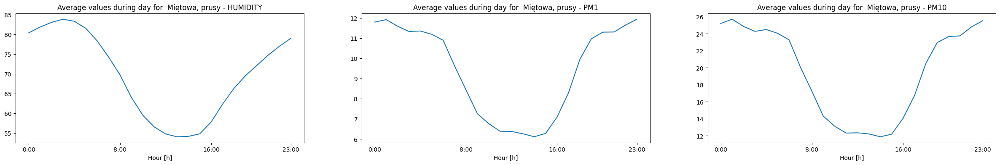

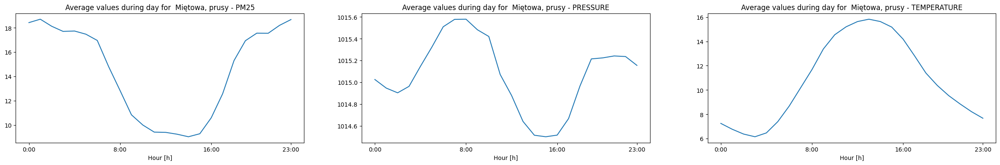

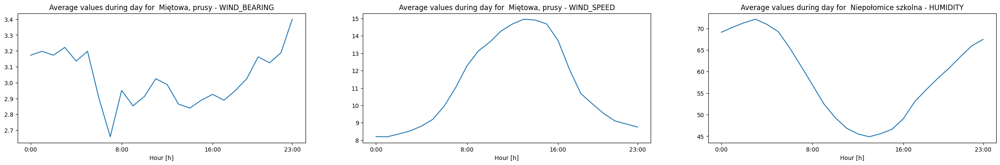

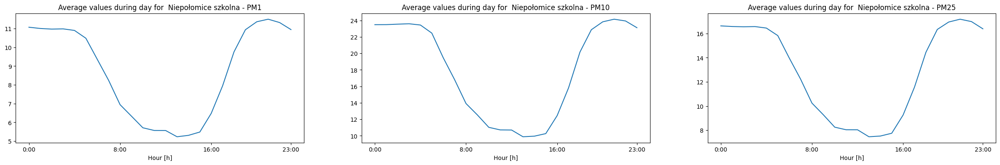

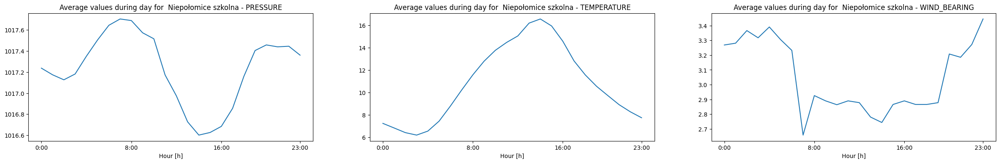

...

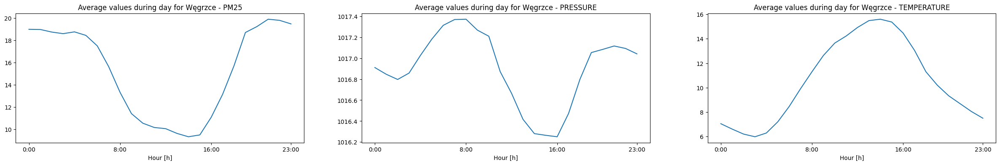

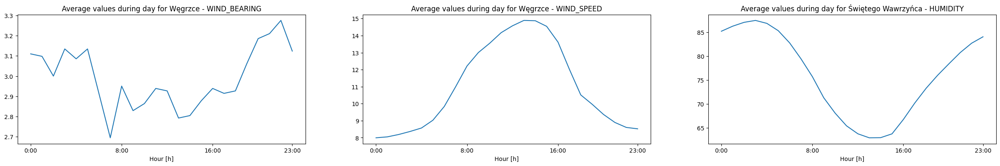

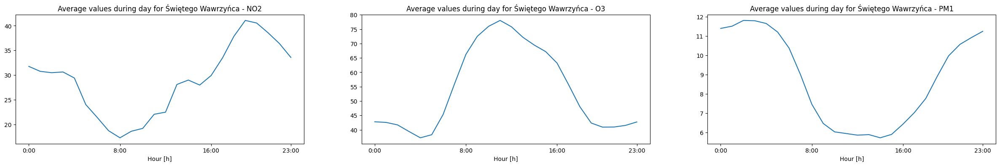

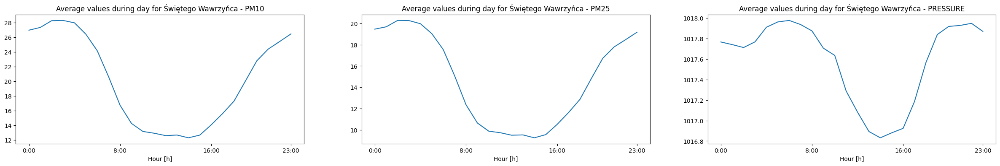

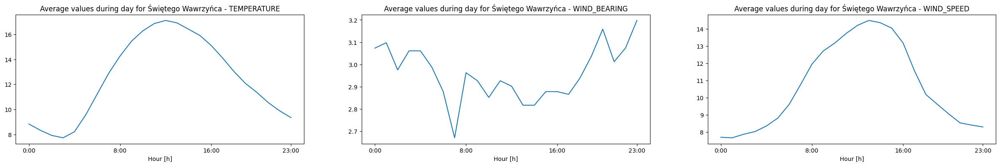

In [166]:
plot_days(df_m, df_s)

In [167]:
def plot_weeks(df_m, df_s):
    N = df_s["Station"].count()
    k = 0
    fig, ax = None, None
    for n in range(N):
        station = df_s.loc[n, "Station"]
        pollution = df_s.loc[n, "Pollution"]
        subset = df_m.loc[(df_m["Station"] == station) & (df_m["Pollution"] == pollution)]
        values = subset.groupby("WeekDay")["Value"].mean().reset_index()["Value"].to_numpy()
        if values.shape[0] != 7:
            continue
        if k%K == 0:
            fig, ax = plt.subplots(1, min(K, N))
            fig.set_size_inches(min(K, N)*9, 4)
        times = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
        ax[k%K].bar(times, values)
        ax[k%K].set_title(f"Average values during day for {df_s.loc[n]['Station']} - {df_s.loc[n]['Pollution']}")
        if k%K == K-1:
            plt.show()
            fig.clear()
        k += 1

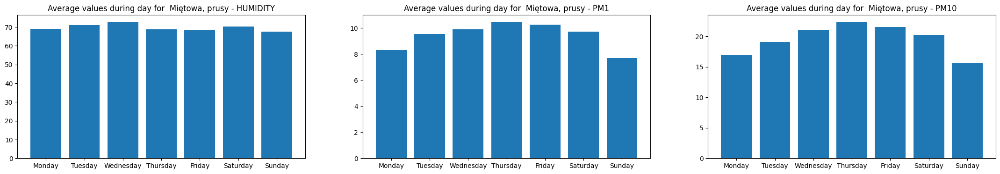

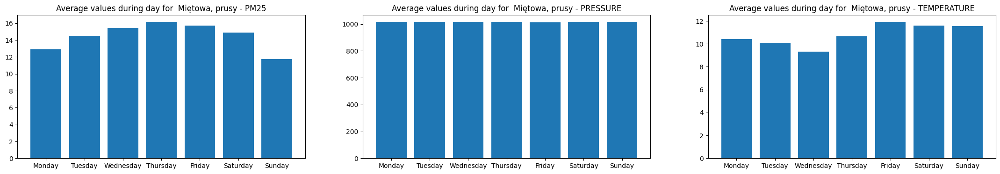

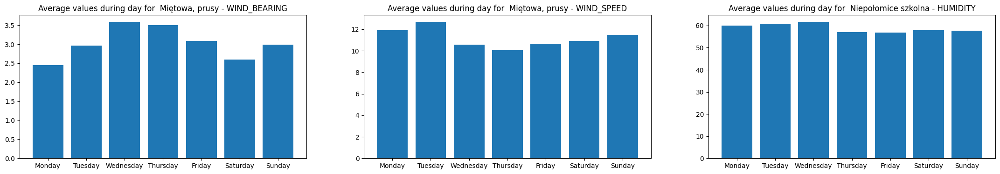

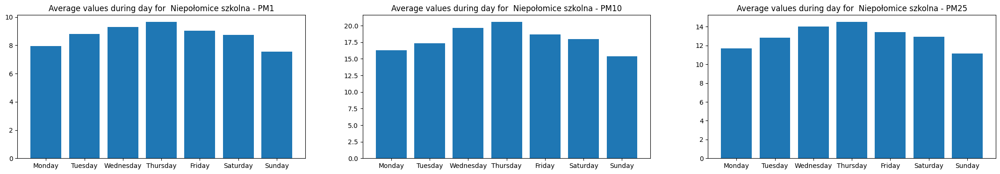

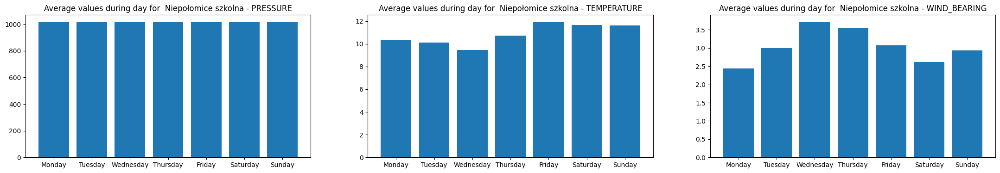

...

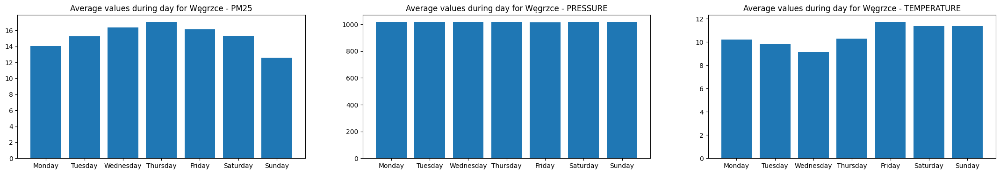

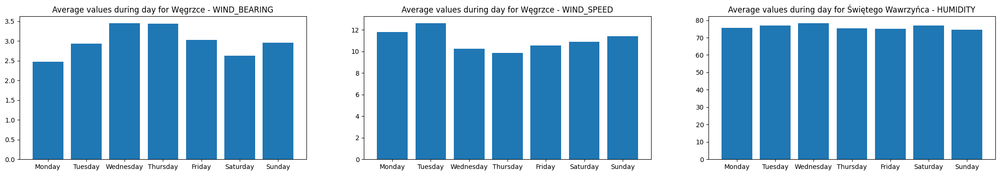

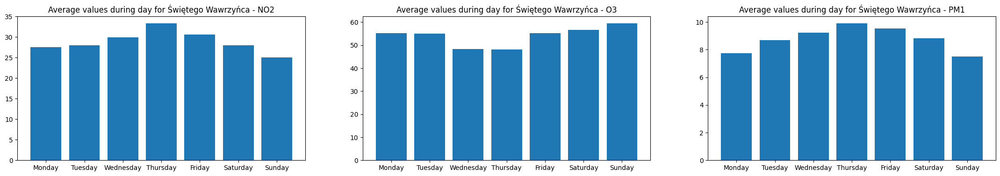

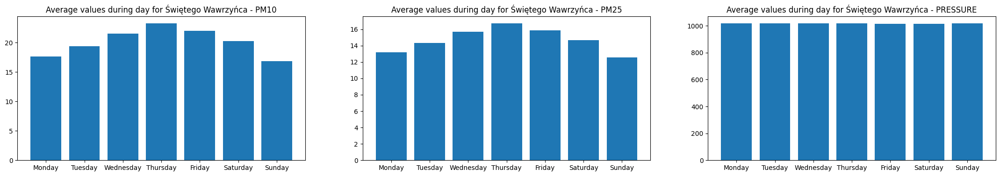

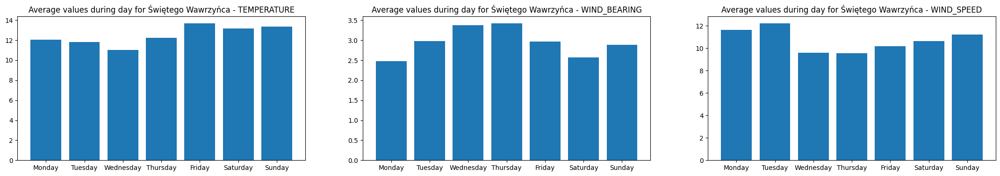

In [168]:
plot_weeks(df_m, df_s)